##### Copyright 2022 Qiyang Hu

In [ ]:
#@title Licensed under MIT License (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://huqy.github.io/deep_learning_workshops/LICENSE.md
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

The main ideas of data processing and modelling are borrowed from two Kaggle kernels listed below. Please check them for detailed information.



*   [GAN Dogs Starter](https://www.kaggle.com/wendykan/gan-dogs-starter)
*   [RaLSGAN Dogs](https://www.kaggle.com/speedwagon/ralsgan-dogs)


# Setting up the environment and downlading the dataset

In [1]:
from __future__ import print_function
import os
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np

from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm
from PIL import Image

import zipfile

%matplotlib inline

print(torch.__version__)
torch.cuda.get_device_name(0)

1.10.0+cu111


'Tesla T4'

In [2]:
from google.colab import files
files.upload();

Saving kaggle.json to kaggle.json


In [3]:
!mkdir -p /root/.kaggle
!cp kaggle.json /root/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle config set -n path -v{/content}

- path is now set to: {/content}


In [4]:
!kaggle competitions list -s generative

ref                    deadline             category   reward  teamCount  userHasEntered  
---------------------  -------------------  --------  -------  ---------  --------------  
generative-dog-images  2019-08-28 19:23:00  Research  $10,000        927            True  


In [5]:
!kaggle competitions download -c generative-dog-images -p /content

 83% 14.0M/16.8M [00:00<00:00, 144MB/s]
100% 16.8M/16.8M [00:00<00:00, 155MB/s]
 98% 723M/739M [00:04<00:00, 135MB/s]
100% 739M/739M [00:04<00:00, 162MB/s]


In [ ]:
with zipfile.ZipFile("all-dogs.zip","r") as zip_ref:
    zip_ref.extractall("/content/all-dogs/")
with zipfile.ZipFile("Annotation.zip","r") as zip_ref:
    zip_ref.extractall("/content/all-dogs/")

There are 20579 pictures of dogs.


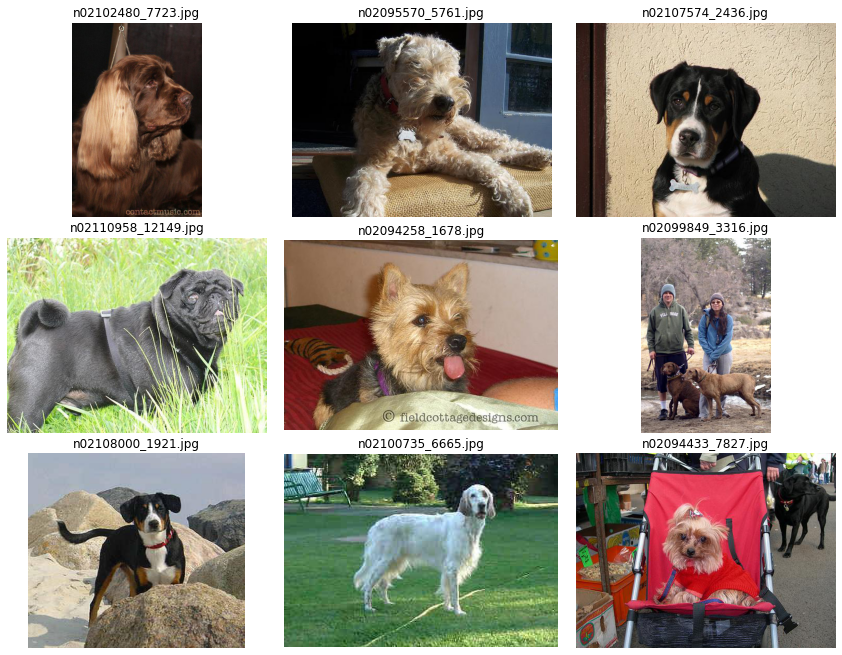

In [ ]:
PATH = '/content/all-dogs/all-dogs/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of dogs.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Preprocessing data

In [ ]:
batch_size = 32
image_size = 64

In [ ]:
random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
#random_transforms = [transforms.RandomRotation(degrees=5)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.3),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('/content/all-dogs/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

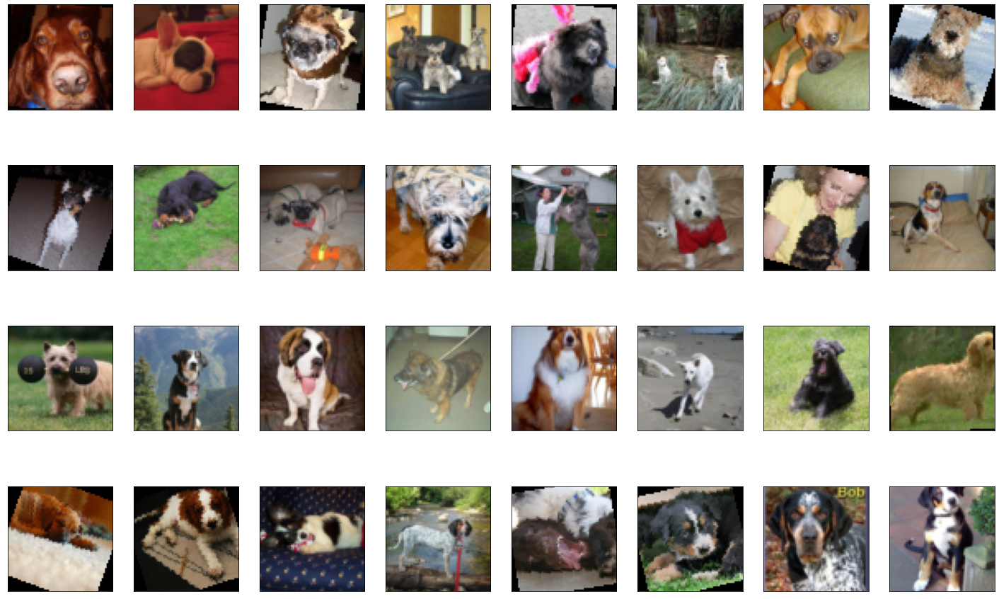

In [ ]:
fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(imgs):
    ax = fig.add_subplot(4, 8, ii + 1, xticks=[], yticks=[])
    
    plt.imshow((img+1)/2)

# Defining Generator and Discriminator

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

**NOTE**


*   `convlayer` returns a list of layers. the Asterik is used for Unpacking, it works like: `[*[1, 2], *[3,4]] == [1, 2, 3, 4]`
*   The `LeakyReLu` output is positive for a positive input and controlled negative for a negative input. This architecture may prevent discriminator to reach vanishing gradient and the learning to continue




# Training GANs

## Setting parameters

In [ ]:
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9 
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Note: `real_label=0.9` is done so that the discriminator does not learn too quickly. If we have the perfect discriminator, the generator will not be able to learn anything.

## Initializing models and optimizers

In [ ]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [ ]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [ ]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    #figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    figure, axes = plt.subplots(1, len(sample), figsize = (25,16))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

## Training loops

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


[1/100][322/644] Loss_D: 1.0972 Loss_G: 1.5546 D(x): 0.5588 D(G(z)): 0.3207 / 0.2073
[1/100][644/644] Loss_D: 1.1914 Loss_G: 2.1465 D(x): 0.6345 D(G(z)): 0.4608 / 0.1365



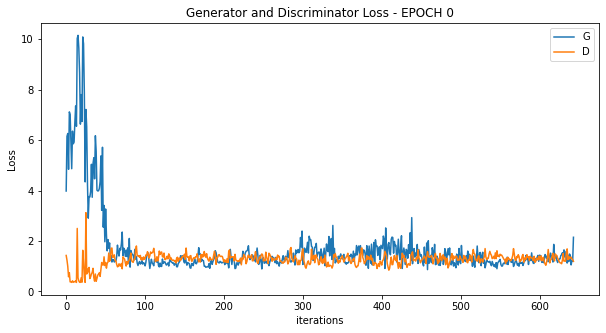

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


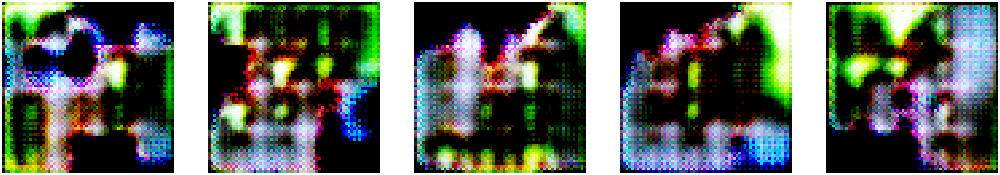

[2/100][322/644] Loss_D: 1.2685 Loss_G: 1.2744 D(x): 0.4600 D(G(z)): 0.3468 / 0.2637
[2/100][644/644] Loss_D: 1.0843 Loss_G: 3.8341 D(x): 0.7166 D(G(z)): 0.4369 / 0.0143



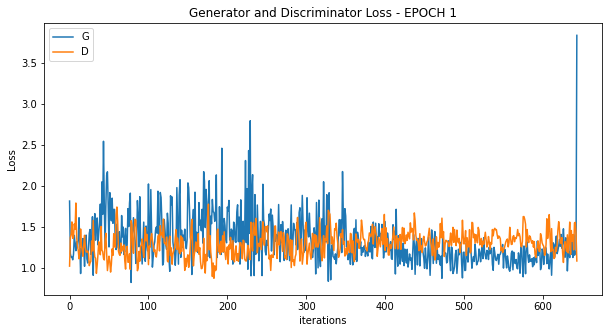

[3/100][322/644] Loss_D: 1.0960 Loss_G: 1.3839 D(x): 0.6562 D(G(z)): 0.4120 / 0.2386
[3/100][644/644] Loss_D: 0.9514 Loss_G: 2.6164 D(x): 0.6235 D(G(z)): 0.3335 / 0.0651



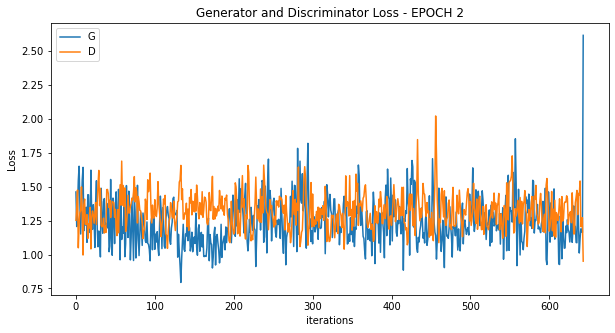

[4/100][322/644] Loss_D: 1.4142 Loss_G: 1.4655 D(x): 0.5229 D(G(z)): 0.4883 / 0.2163
[4/100][644/644] Loss_D: 1.4126 Loss_G: 2.7655 D(x): 0.5107 D(G(z)): 0.4775 / 0.0583



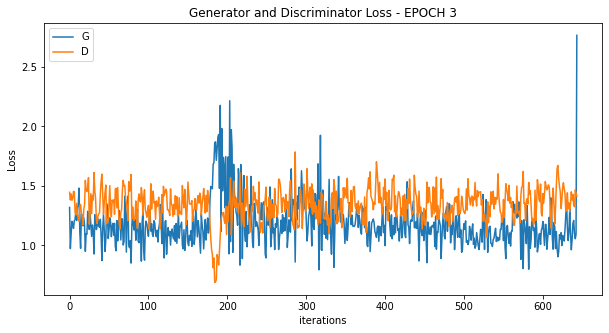

[5/100][322/644] Loss_D: 1.6123 Loss_G: 0.9730 D(x): 0.3399 D(G(z)): 0.4150 / 0.3635
[5/100][644/644] Loss_D: 1.6946 Loss_G: 1.5323 D(x): 0.2524 D(G(z)): 0.3417 / 0.1895



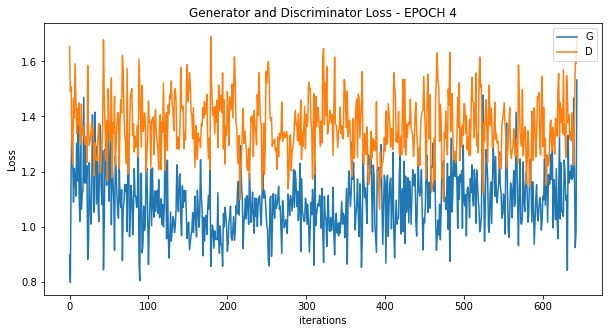

[6/100][322/644] Loss_D: 1.3153 Loss_G: 1.1250 D(x): 0.4601 D(G(z)): 0.3972 / 0.3080
[6/100][644/644] Loss_D: 1.6599 Loss_G: 1.3104 D(x): 0.2953 D(G(z)): 0.3908 / 0.2503



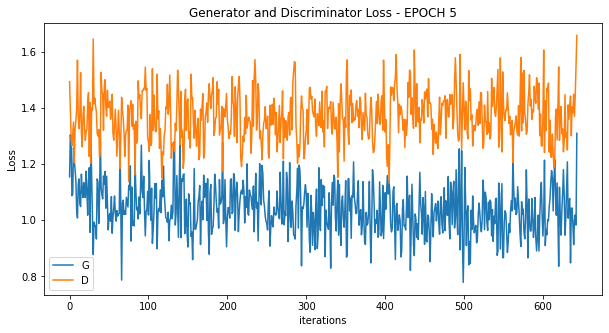

[7/100][322/644] Loss_D: 1.3839 Loss_G: 1.1660 D(x): 0.5112 D(G(z)): 0.4889 / 0.2919
[7/100][644/644] Loss_D: 1.5323 Loss_G: 1.1782 D(x): 0.3681 D(G(z)): 0.4350 / 0.2894



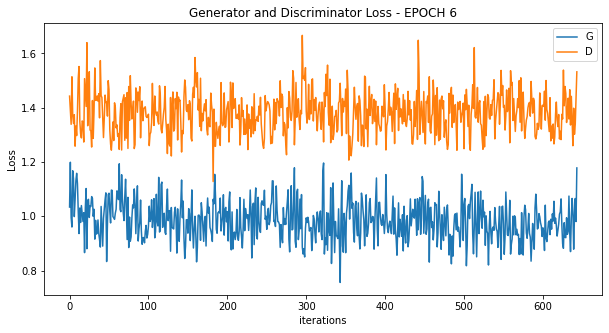

[8/100][322/644] Loss_D: 1.2917 Loss_G: 1.0329 D(x): 0.5436 D(G(z)): 0.4711 / 0.3429
[8/100][644/644] Loss_D: 1.4220 Loss_G: 1.3556 D(x): 0.3665 D(G(z)): 0.3693 / 0.2288



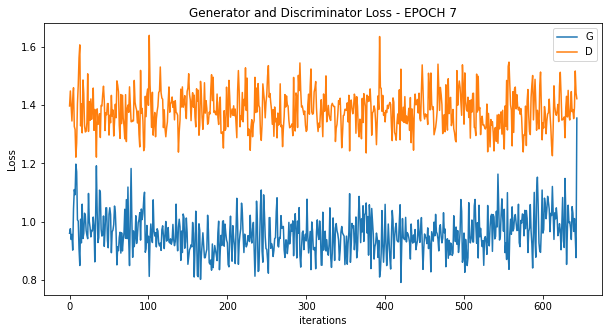

[9/100][322/644] Loss_D: 1.3574 Loss_G: 1.0424 D(x): 0.4776 D(G(z)): 0.4483 / 0.3363
[9/100][644/644] Loss_D: 1.2735 Loss_G: 1.2931 D(x): 0.4231 D(G(z)): 0.3368 / 0.2456



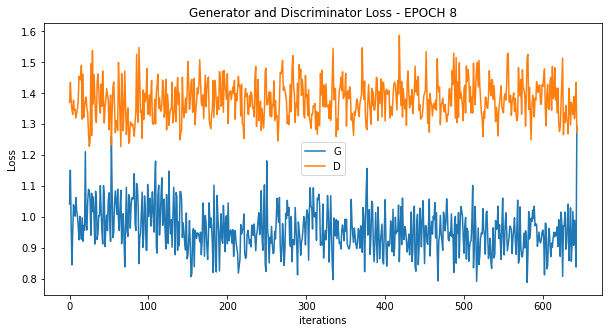

[10/100][322/644] Loss_D: 1.4094 Loss_G: 1.0209 D(x): 0.5226 D(G(z)): 0.5094 / 0.3459
[10/100][644/644] Loss_D: 1.5299 Loss_G: 1.2987 D(x): 0.3846 D(G(z)): 0.4499 / 0.2547



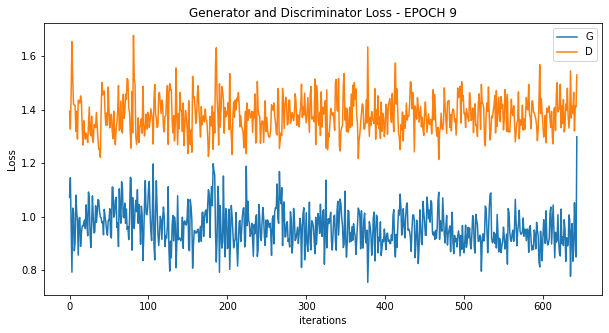

[11/100][322/644] Loss_D: 1.3034 Loss_G: 0.9571 D(x): 0.4770 D(G(z)): 0.4206 / 0.3725
[11/100][644/644] Loss_D: 1.3934 Loss_G: 1.4529 D(x): 0.4047 D(G(z)): 0.3967 / 0.2073



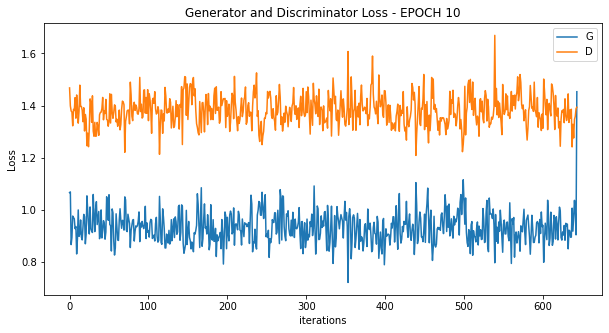

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


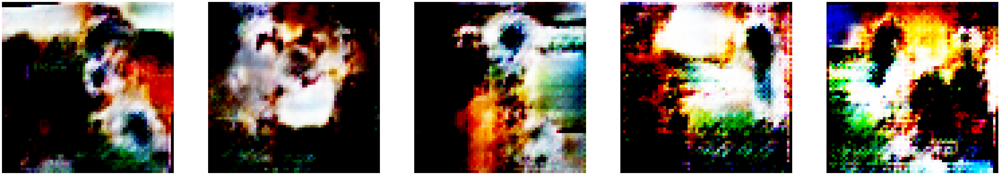

[12/100][322/644] Loss_D: 1.2931 Loss_G: 0.9577 D(x): 0.4984 D(G(z)): 0.4363 / 0.3730
[12/100][644/644] Loss_D: 1.2499 Loss_G: 1.2603 D(x): 0.3769 D(G(z)): 0.2653 / 0.2598



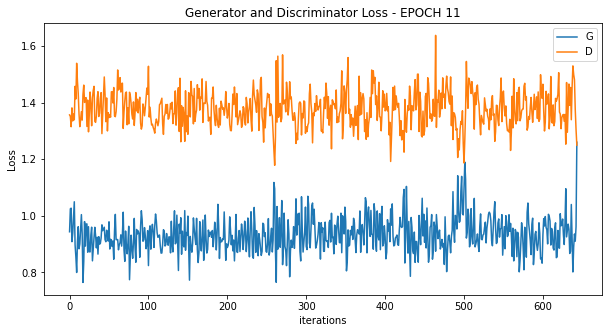

[13/100][322/644] Loss_D: 1.3535 Loss_G: 0.9790 D(x): 0.4648 D(G(z)): 0.4384 / 0.3587
[13/100][644/644] Loss_D: 1.3198 Loss_G: 1.3424 D(x): 0.3844 D(G(z)): 0.3338 / 0.2321



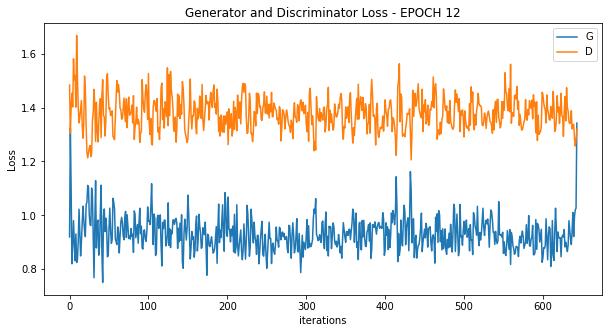

[14/100][322/644] Loss_D: 1.3260 Loss_G: 0.8709 D(x): 0.4441 D(G(z)): 0.4058 / 0.4064
[14/100][644/644] Loss_D: 1.0398 Loss_G: 1.5560 D(x): 0.4997 D(G(z)): 0.2891 / 0.1846



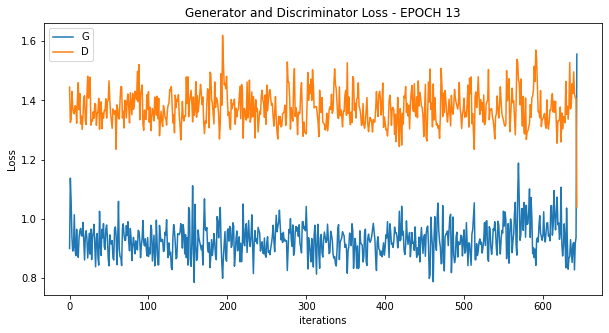

[15/100][322/644] Loss_D: 1.3608 Loss_G: 0.9254 D(x): 0.4407 D(G(z)): 0.4122 / 0.3823
[15/100][644/644] Loss_D: 1.8537 Loss_G: 1.3136 D(x): 0.2576 D(G(z)): 0.4282 / 0.2395



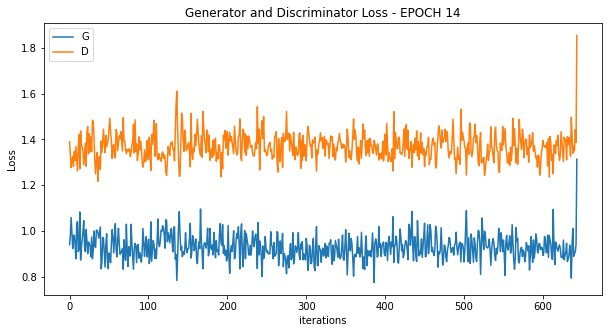

[16/100][322/644] Loss_D: 1.3430 Loss_G: 0.9292 D(x): 0.4563 D(G(z)): 0.4253 / 0.3853
[16/100][644/644] Loss_D: 1.5228 Loss_G: 1.5021 D(x): 0.3134 D(G(z)): 0.3247 / 0.1949



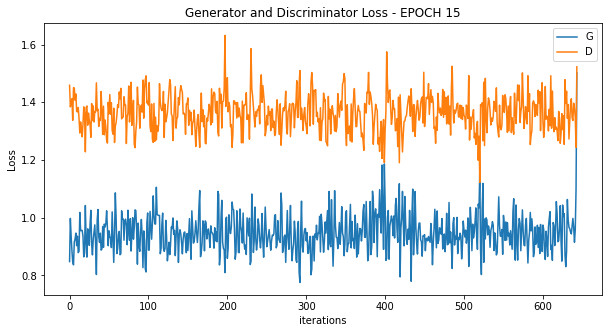

[17/100][322/644] Loss_D: 1.2543 Loss_G: 1.0896 D(x): 0.5302 D(G(z)): 0.4376 / 0.3190
[17/100][644/644] Loss_D: 1.3657 Loss_G: 1.2434 D(x): 0.3723 D(G(z)): 0.3438 / 0.2607



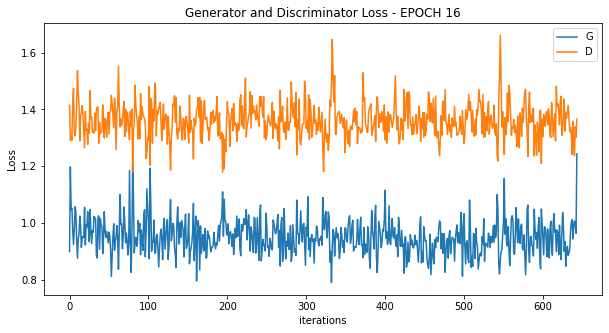

[18/100][322/644] Loss_D: 1.3924 Loss_G: 0.9407 D(x): 0.4941 D(G(z)): 0.4774 / 0.3815
[18/100][644/644] Loss_D: 1.4554 Loss_G: 1.6828 D(x): 0.4125 D(G(z)): 0.4478 / 0.1699



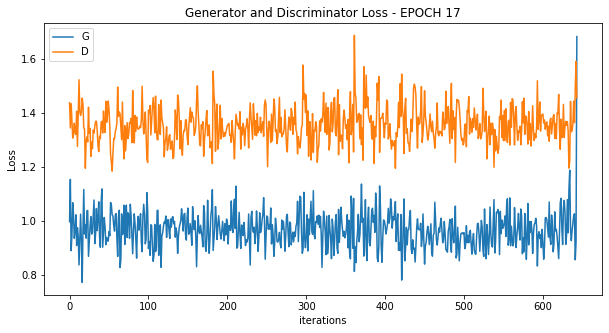

[19/100][322/644] Loss_D: 1.2794 Loss_G: 1.0083 D(x): 0.5088 D(G(z)): 0.4333 / 0.3548
[19/100][644/644] Loss_D: 1.4580 Loss_G: 0.9600 D(x): 0.2967 D(G(z)): 0.2764 / 0.3631



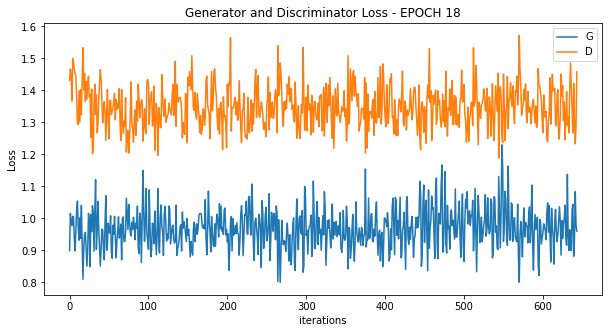

[20/100][322/644] Loss_D: 1.3123 Loss_G: 0.9994 D(x): 0.4942 D(G(z)): 0.4345 / 0.3575
[20/100][644/644] Loss_D: 1.3048 Loss_G: 1.7065 D(x): 0.4169 D(G(z)): 0.3624 / 0.1678



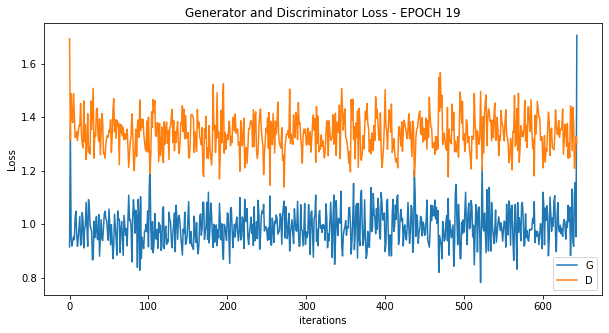

[21/100][322/644] Loss_D: 1.3444 Loss_G: 1.0697 D(x): 0.4652 D(G(z)): 0.4232 / 0.3252
[21/100][644/644] Loss_D: 1.4410 Loss_G: 1.1683 D(x): 0.3369 D(G(z)): 0.3287 / 0.2837



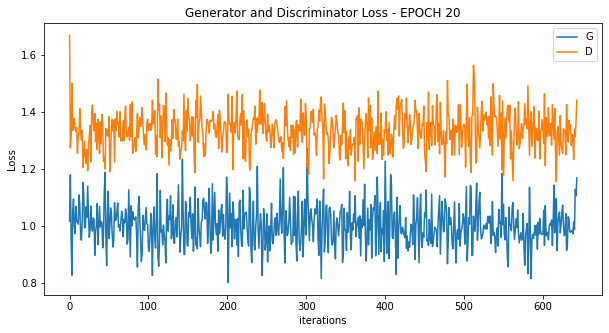

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


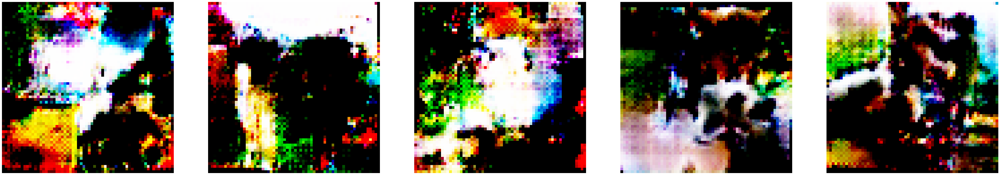

[22/100][322/644] Loss_D: 1.2975 Loss_G: 0.9544 D(x): 0.4800 D(G(z)): 0.4147 / 0.3779
[22/100][644/644] Loss_D: 1.4254 Loss_G: 1.3322 D(x): 0.2957 D(G(z)): 0.2284 / 0.2433



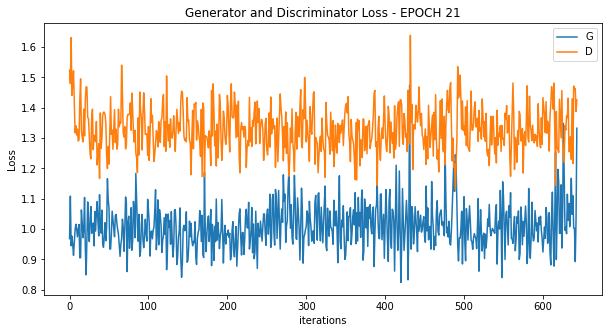

[23/100][322/644] Loss_D: 1.3477 Loss_G: 0.9489 D(x): 0.4137 D(G(z)): 0.3681 / 0.3789
[23/100][644/644] Loss_D: 1.5713 Loss_G: 1.8963 D(x): 0.2939 D(G(z)): 0.3491 / 0.1384



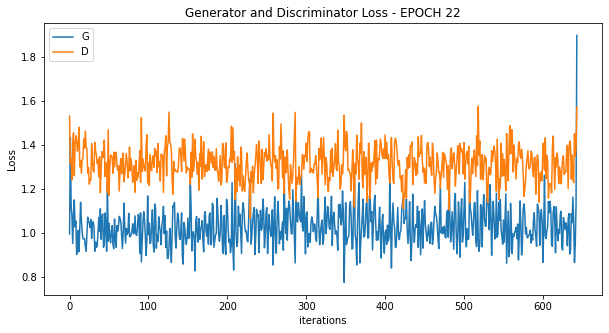

[24/100][322/644] Loss_D: 1.3150 Loss_G: 1.0033 D(x): 0.4809 D(G(z)): 0.4222 / 0.3589
[24/100][644/644] Loss_D: 0.9003 Loss_G: 2.3561 D(x): 0.6112 D(G(z)): 0.2725 / 0.0825



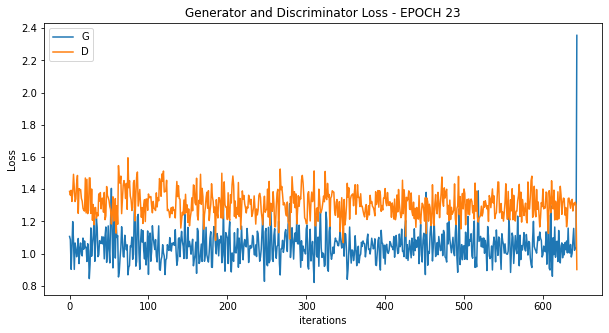

[25/100][322/644] Loss_D: 1.3463 Loss_G: 1.1134 D(x): 0.4547 D(G(z)): 0.4023 / 0.3241
[25/100][644/644] Loss_D: 1.5189 Loss_G: 1.7252 D(x): 0.3232 D(G(z)): 0.3632 / 0.1530



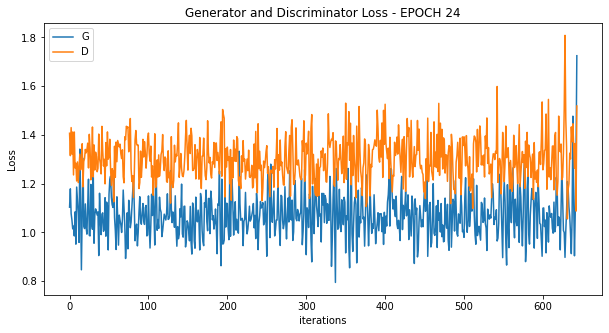

[26/100][322/644] Loss_D: 1.3272 Loss_G: 1.0948 D(x): 0.5292 D(G(z)): 0.4690 / 0.3239
[26/100][644/644] Loss_D: 1.4838 Loss_G: 1.9038 D(x): 0.3482 D(G(z)): 0.3589 / 0.1240



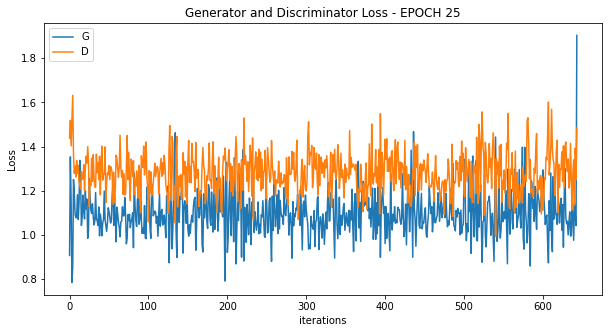

[27/100][322/644] Loss_D: 1.1429 Loss_G: 1.2016 D(x): 0.5553 D(G(z)): 0.3716 / 0.2880
[27/100][644/644] Loss_D: 1.5397 Loss_G: 1.5692 D(x): 0.2741 D(G(z)): 0.2037 / 0.1904



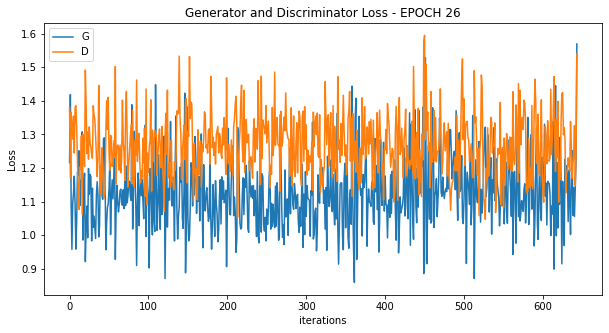

[28/100][322/644] Loss_D: 1.2135 Loss_G: 1.1184 D(x): 0.5322 D(G(z)): 0.3951 / 0.3143
[28/100][644/644] Loss_D: 1.3374 Loss_G: 1.4301 D(x): 0.3113 D(G(z)): 0.2004 / 0.2130



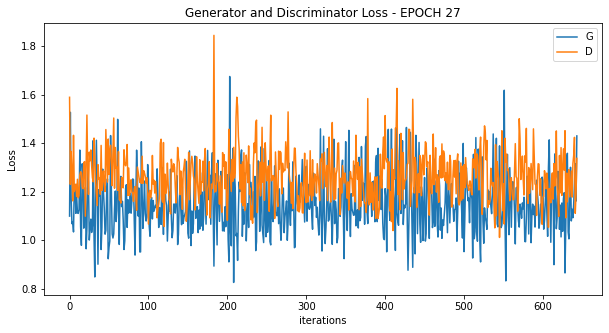

[29/100][322/644] Loss_D: 1.2182 Loss_G: 1.1919 D(x): 0.5068 D(G(z)): 0.3762 / 0.2940
[29/100][644/644] Loss_D: 1.5874 Loss_G: 1.6662 D(x): 0.3123 D(G(z)): 0.1690 / 0.1671



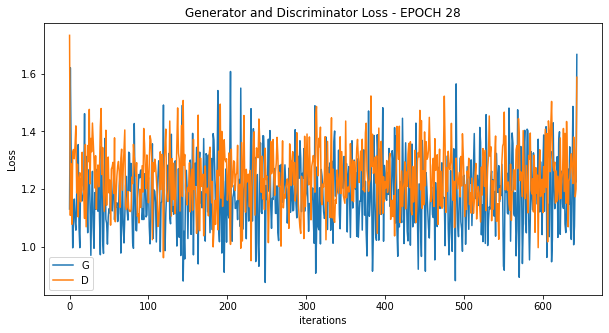

[30/100][322/644] Loss_D: 1.4316 Loss_G: 0.9263 D(x): 0.4735 D(G(z)): 0.4378 / 0.3967
[30/100][644/644] Loss_D: 1.4891 Loss_G: 1.3741 D(x): 0.2736 D(G(z)): 0.2133 / 0.2306



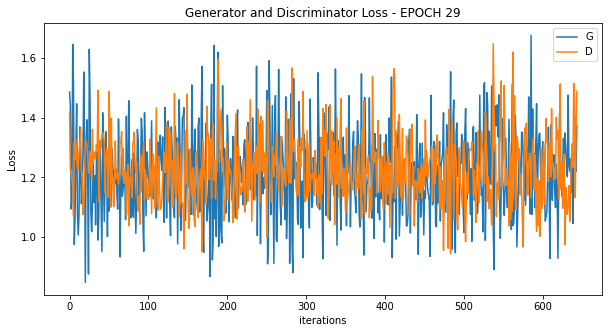

[31/100][322/644] Loss_D: 1.3404 Loss_G: 1.0859 D(x): 0.4329 D(G(z)): 0.3622 / 0.3371
[31/100][644/644] Loss_D: 1.4043 Loss_G: 2.4989 D(x): 0.3676 D(G(z)): 0.3360 / 0.0650



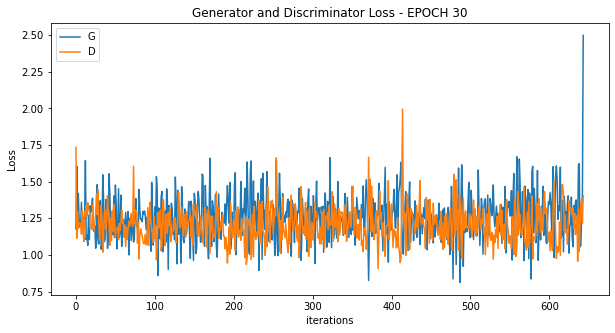

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


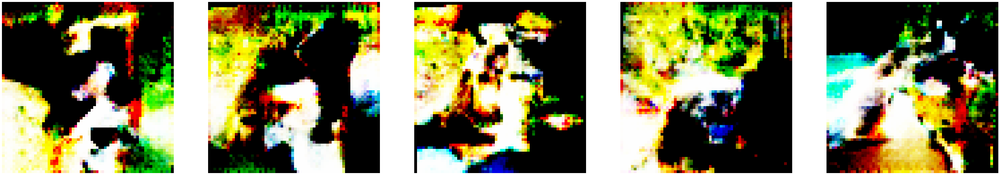

[32/100][322/644] Loss_D: 1.1618 Loss_G: 1.3393 D(x): 0.5460 D(G(z)): 0.3641 / 0.2495
[32/100][644/644] Loss_D: 0.9718 Loss_G: 3.8924 D(x): 0.6933 D(G(z)): 0.3934 / 0.0193



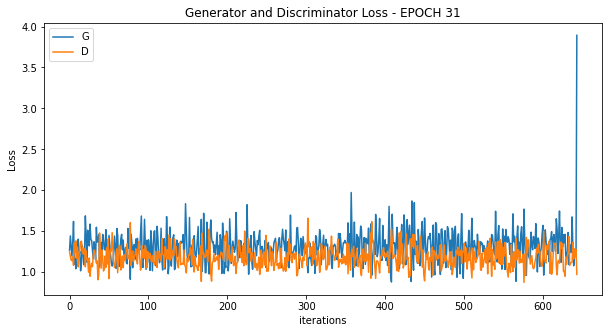

[33/100][322/644] Loss_D: 1.1649 Loss_G: 1.3049 D(x): 0.4719 D(G(z)): 0.2915 / 0.2600
[33/100][644/644] Loss_D: 1.9304 Loss_G: 2.1530 D(x): 0.2171 D(G(z)): 0.3745 / 0.1866



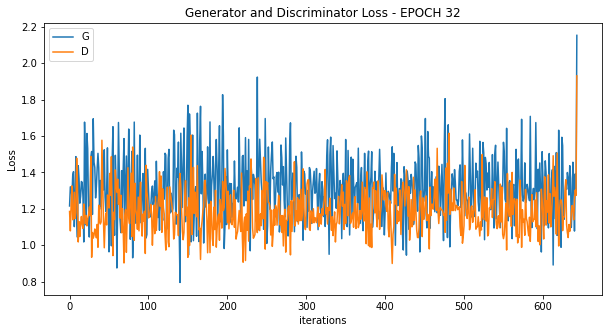

[34/100][322/644] Loss_D: 1.0613 Loss_G: 1.5625 D(x): 0.5596 D(G(z)): 0.3129 / 0.2048
[34/100][644/644] Loss_D: 1.3894 Loss_G: 1.5428 D(x): 0.2995 D(G(z)): 0.2224 / 0.2001



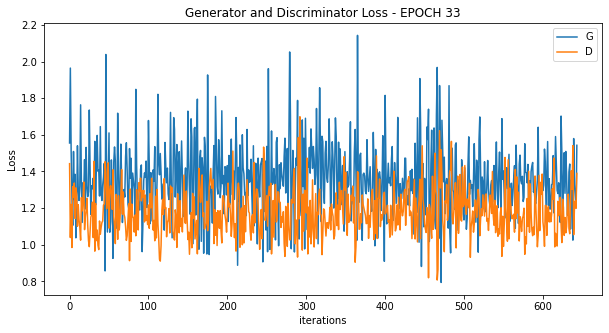

[35/100][322/644] Loss_D: 1.0296 Loss_G: 1.2835 D(x): 0.5448 D(G(z)): 0.2653 / 0.2693
[35/100][644/644] Loss_D: 1.5497 Loss_G: 0.9935 D(x): 0.2796 D(G(z)): 0.1685 / 0.3579



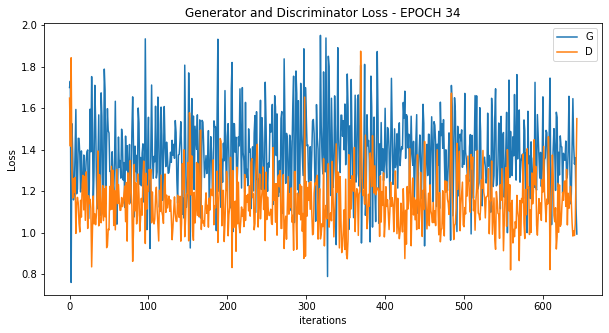

[36/100][322/644] Loss_D: 1.0662 Loss_G: 1.4696 D(x): 0.5762 D(G(z)): 0.3348 / 0.2119
[36/100][644/644] Loss_D: 0.9112 Loss_G: 3.9780 D(x): 0.7116 D(G(z)): 0.3637 / 0.0146



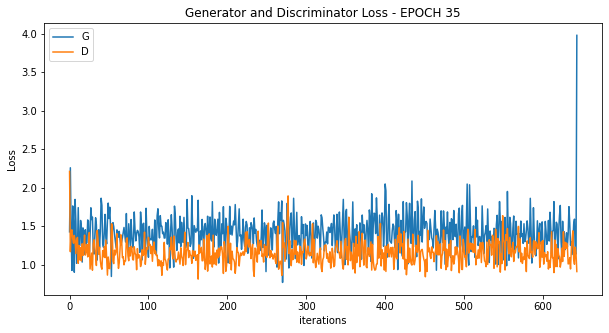

[37/100][322/644] Loss_D: 1.1114 Loss_G: 2.0501 D(x): 0.7009 D(G(z)): 0.4393 / 0.1253
[37/100][644/644] Loss_D: 1.6103 Loss_G: 3.0716 D(x): 0.2891 D(G(z)): 0.2892 / 0.1710



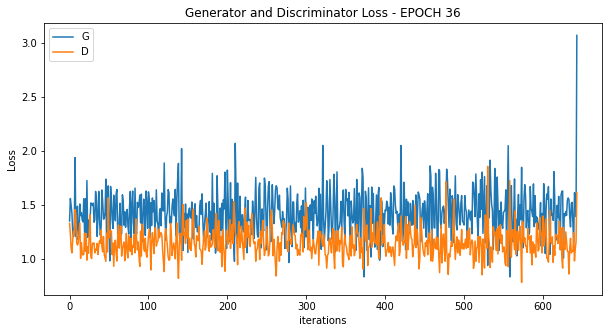

[38/100][322/644] Loss_D: 1.2018 Loss_G: 1.2070 D(x): 0.4566 D(G(z)): 0.2874 / 0.2957
[38/100][644/644] Loss_D: 0.8702 Loss_G: 2.3611 D(x): 0.4560 D(G(z)): 0.0725 / 0.0732



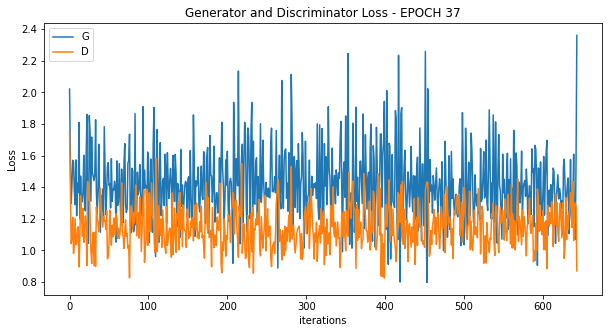

[39/100][322/644] Loss_D: 1.0585 Loss_G: 1.3872 D(x): 0.5699 D(G(z)): 0.3176 / 0.2507
[39/100][644/644] Loss_D: 1.9379 Loss_G: 0.8715 D(x): 0.1338 D(G(z)): 0.0885 / 0.4025



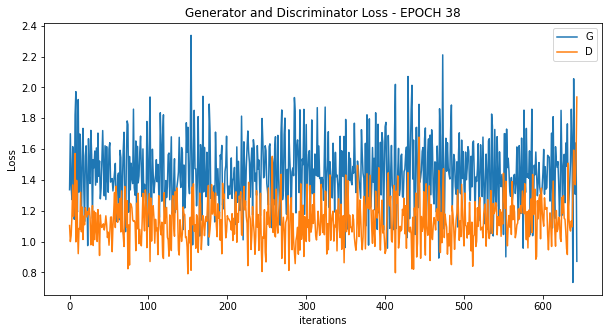

[40/100][322/644] Loss_D: 1.1809 Loss_G: 1.2725 D(x): 0.4950 D(G(z)): 0.3170 / 0.2817
[40/100][644/644] Loss_D: 1.0101 Loss_G: 3.3084 D(x): 0.4912 D(G(z)): 0.2265 / 0.0391



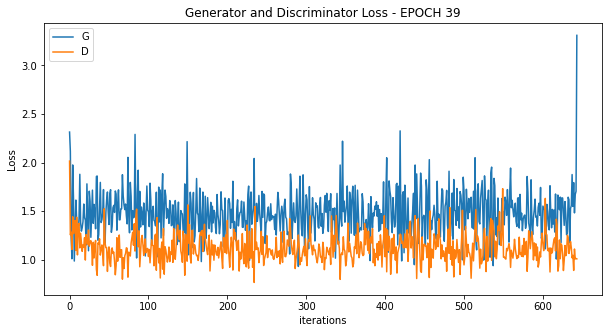

[41/100][322/644] Loss_D: 1.1794 Loss_G: 1.4380 D(x): 0.5558 D(G(z)): 0.3568 / 0.2356
[41/100][644/644] Loss_D: 1.1205 Loss_G: 2.6265 D(x): 0.4127 D(G(z)): 0.2195 / 0.0634



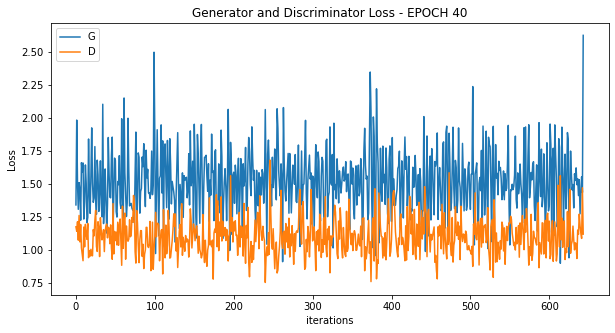

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


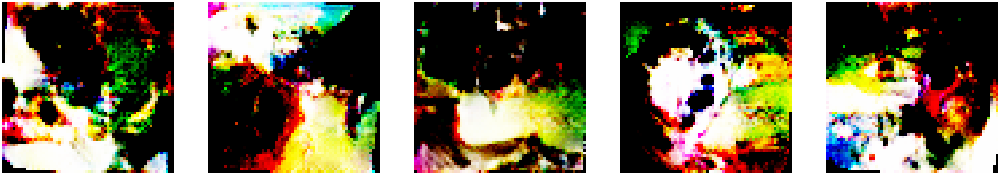

[42/100][322/644] Loss_D: 1.3564 Loss_G: 1.1688 D(x): 0.4470 D(G(z)): 0.3724 / 0.3215
[42/100][644/644] Loss_D: 0.7987 Loss_G: 3.0320 D(x): 0.6367 D(G(z)): 0.1531 / 0.0392



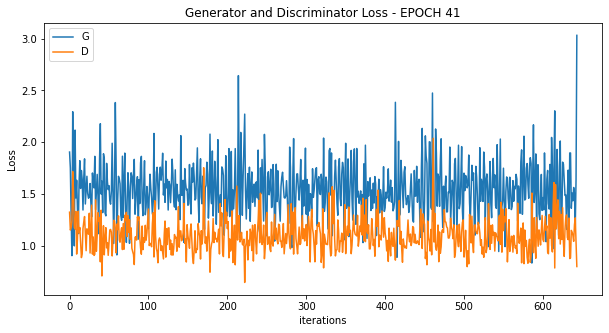

[43/100][322/644] Loss_D: 1.0973 Loss_G: 1.5672 D(x): 0.4610 D(G(z)): 0.1997 / 0.2136
[43/100][644/644] Loss_D: 0.7114 Loss_G: 2.8582 D(x): 0.5772 D(G(z)): 0.0964 / 0.0420



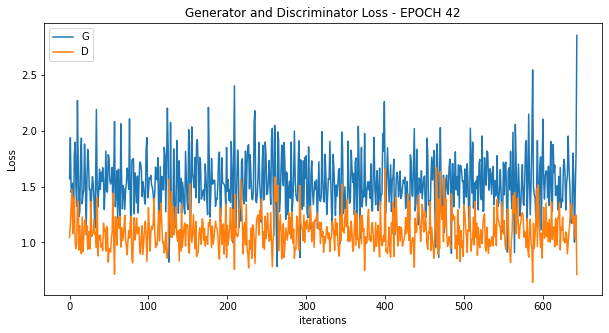

[44/100][322/644] Loss_D: 1.0897 Loss_G: 1.3113 D(x): 0.4551 D(G(z)): 0.2211 / 0.2760
[44/100][644/644] Loss_D: 0.9908 Loss_G: 2.9646 D(x): 0.4737 D(G(z)): 0.2187 / 0.0386



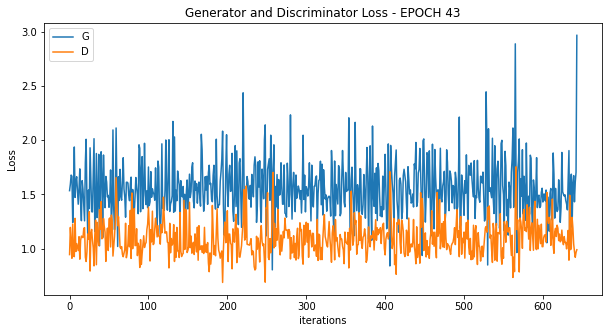

[45/100][322/644] Loss_D: 1.3301 Loss_G: 1.4220 D(x): 0.4196 D(G(z)): 0.3072 / 0.2420
[45/100][644/644] Loss_D: 0.7190 Loss_G: 2.7797 D(x): 0.6117 D(G(z)): 0.1510 / 0.0532



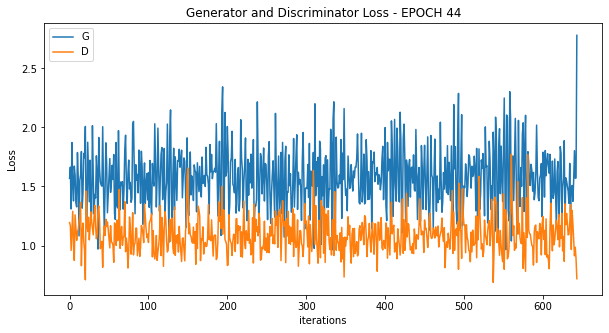

[46/100][322/644] Loss_D: 0.9510 Loss_G: 1.7823 D(x): 0.6607 D(G(z)): 0.3103 / 0.1610
[46/100][644/644] Loss_D: 0.5823 Loss_G: 2.9597 D(x): 0.6294 D(G(z)): 0.0598 / 0.0381



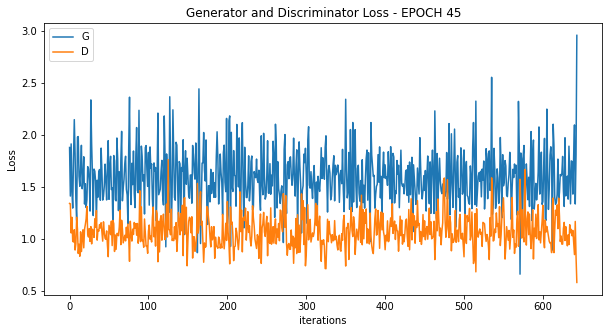

[47/100][322/644] Loss_D: 1.1185 Loss_G: 1.7148 D(x): 0.5036 D(G(z)): 0.2376 / 0.1811
[47/100][644/644] Loss_D: 1.9120 Loss_G: 1.4733 D(x): 0.2263 D(G(z)): 0.0831 / 0.2050



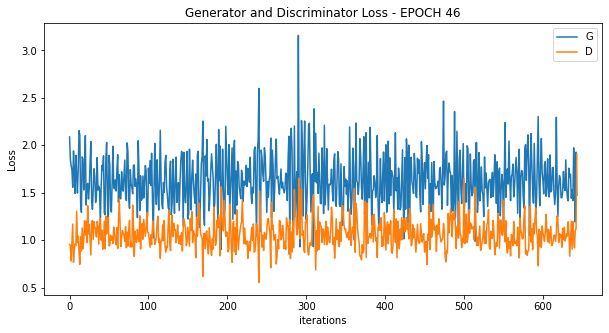

[48/100][322/644] Loss_D: 1.1218 Loss_G: 1.5171 D(x): 0.4839 D(G(z)): 0.2387 / 0.2408
[48/100][644/644] Loss_D: 1.0186 Loss_G: 3.3370 D(x): 0.5377 D(G(z)): 0.2850 / 0.0299



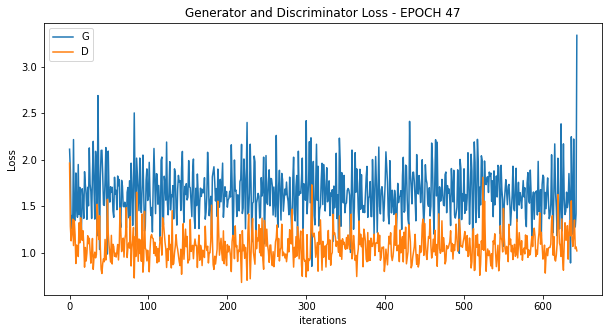

[49/100][322/644] Loss_D: 1.0648 Loss_G: 1.6675 D(x): 0.7388 D(G(z)): 0.4179 / 0.1861
[49/100][644/644] Loss_D: 0.7149 Loss_G: 3.0343 D(x): 0.6339 D(G(z)): 0.1797 / 0.0430



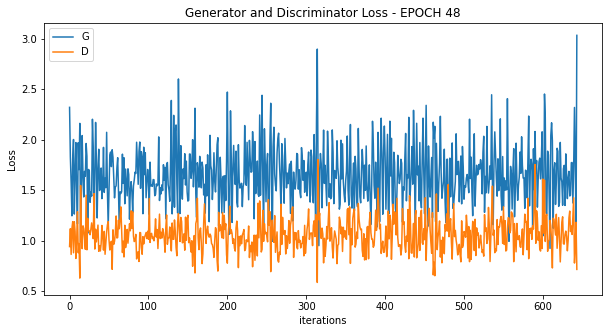

[50/100][322/644] Loss_D: 1.0418 Loss_G: 1.6908 D(x): 0.5132 D(G(z)): 0.2328 / 0.1805
[50/100][644/644] Loss_D: 1.4564 Loss_G: 2.6177 D(x): 0.3322 D(G(z)): 0.2059 / 0.0729



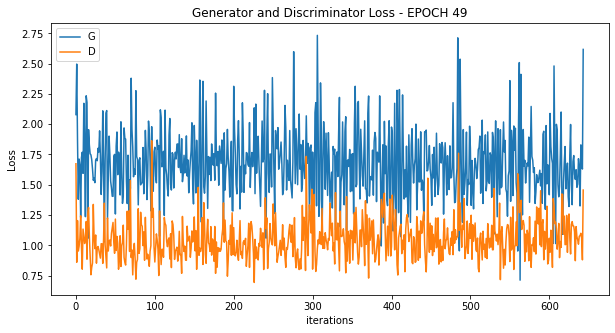

[51/100][322/644] Loss_D: 0.9828 Loss_G: 1.6943 D(x): 0.6518 D(G(z)): 0.3450 / 0.1769
[51/100][644/644] Loss_D: 1.0342 Loss_G: 7.4444 D(x): 0.7404 D(G(z)): 0.4054 / 0.0028



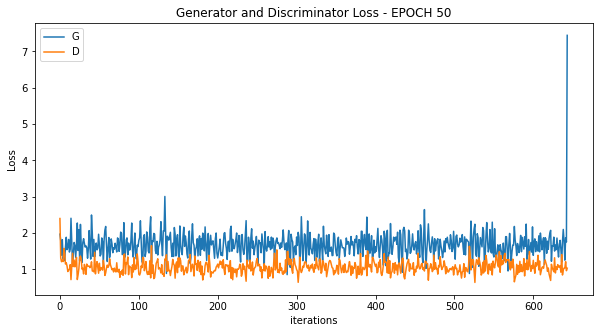

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


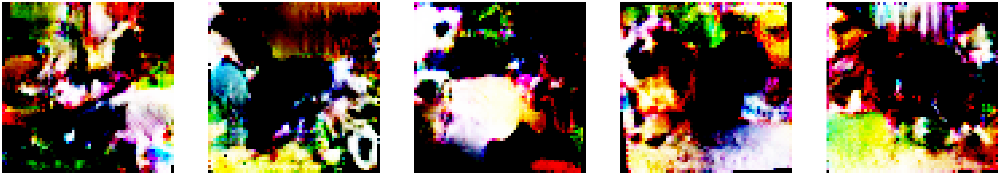

[52/100][322/644] Loss_D: 1.0471 Loss_G: 1.6327 D(x): 0.6167 D(G(z)): 0.3484 / 0.1895
[52/100][644/644] Loss_D: 0.8809 Loss_G: 4.9460 D(x): 0.7064 D(G(z)): 0.3439 / 0.0058



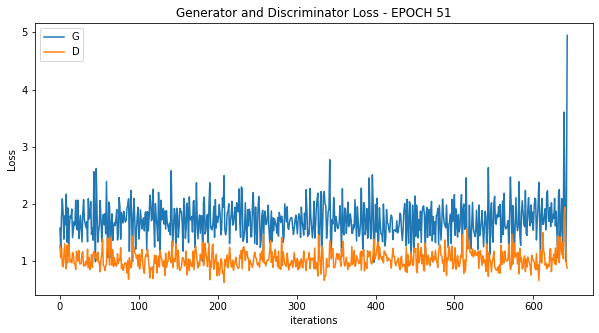

[53/100][322/644] Loss_D: 1.0874 Loss_G: 1.9222 D(x): 0.5308 D(G(z)): 0.2735 / 0.1519
[53/100][644/644] Loss_D: 0.9362 Loss_G: 5.5216 D(x): 0.6648 D(G(z)): 0.3401 / 0.0093



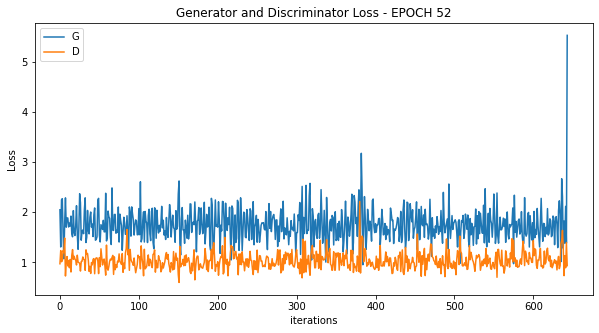

[54/100][322/644] Loss_D: 0.9458 Loss_G: 1.8891 D(x): 0.5640 D(G(z)): 0.1918 / 0.1585
[54/100][644/644] Loss_D: 1.1270 Loss_G: 3.9542 D(x): 0.4297 D(G(z)): 0.2130 / 0.0498



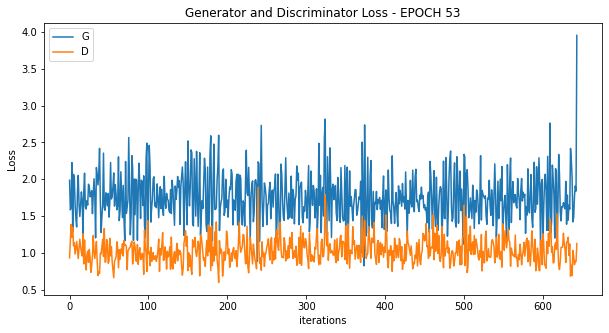

[55/100][322/644] Loss_D: 1.0165 Loss_G: 1.5570 D(x): 0.5041 D(G(z)): 0.2042 / 0.2187
[55/100][644/644] Loss_D: 1.2629 Loss_G: 7.2891 D(x): 0.8407 D(G(z)): 0.4640 / 0.0005



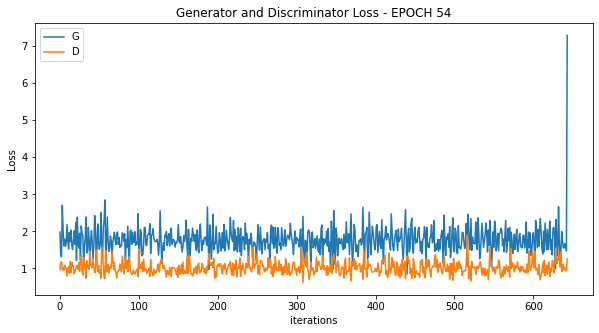

[56/100][322/644] Loss_D: 0.8707 Loss_G: 1.8271 D(x): 0.6560 D(G(z)): 0.2561 / 0.1639
[56/100][644/644] Loss_D: 0.8417 Loss_G: 2.8815 D(x): 0.5850 D(G(z)): 0.0513 / 0.0439



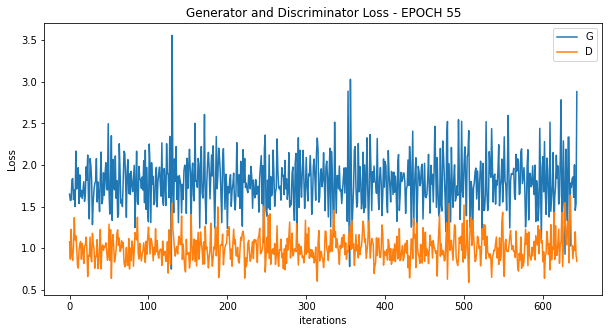

[57/100][322/644] Loss_D: 0.6555 Loss_G: 2.5045 D(x): 0.6522 D(G(z)): 0.0978 / 0.0840
[57/100][644/644] Loss_D: 0.7289 Loss_G: 3.5531 D(x): 0.6164 D(G(z)): 0.1621 / 0.0201



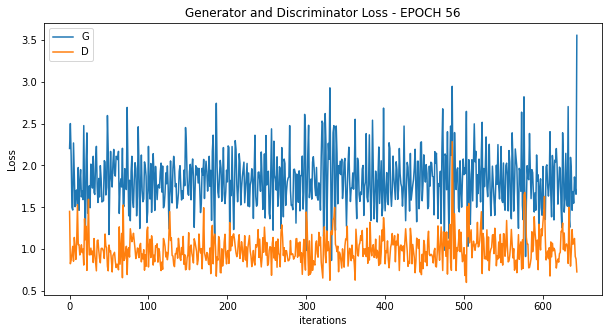

[58/100][322/644] Loss_D: 0.9624 Loss_G: 1.9209 D(x): 0.6867 D(G(z)): 0.3175 / 0.1506
[58/100][644/644] Loss_D: 1.5359 Loss_G: 2.3651 D(x): 0.3938 D(G(z)): 0.1719 / 0.0759



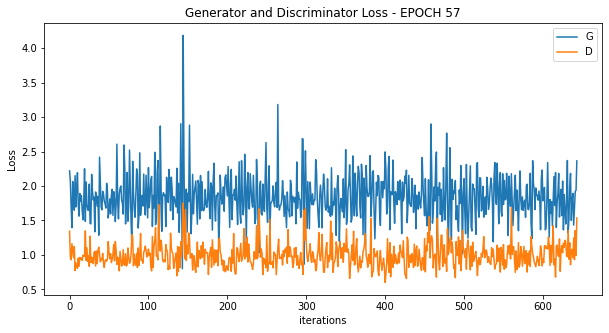

[59/100][322/644] Loss_D: 0.9047 Loss_G: 1.7580 D(x): 0.6975 D(G(z)): 0.3101 / 0.1833
[59/100][644/644] Loss_D: 1.0535 Loss_G: 7.4390 D(x): 0.7132 D(G(z)): 0.3880 / 0.0026



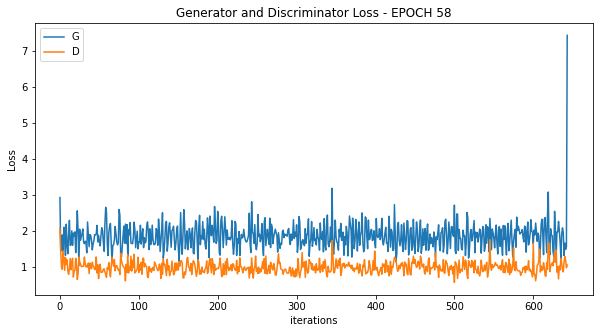

[60/100][322/644] Loss_D: 0.8615 Loss_G: 1.8725 D(x): 0.6262 D(G(z)): 0.2170 / 0.1534
[60/100][644/644] Loss_D: 1.0753 Loss_G: 3.5515 D(x): 0.5382 D(G(z)): 0.1348 / 0.0287



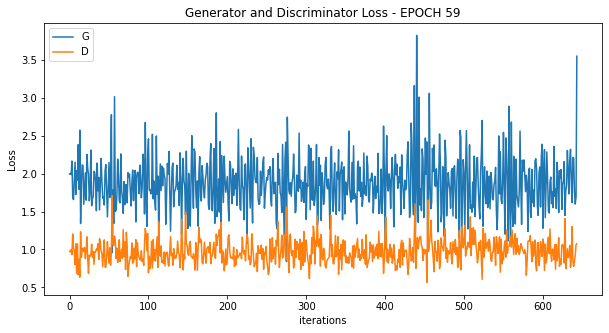

[61/100][322/644] Loss_D: 0.9520 Loss_G: 1.8379 D(x): 0.6414 D(G(z)): 0.2764 / 0.1580
[61/100][644/644] Loss_D: 1.1072 Loss_G: 6.2281 D(x): 0.5705 D(G(z)): 0.3495 / 0.0015



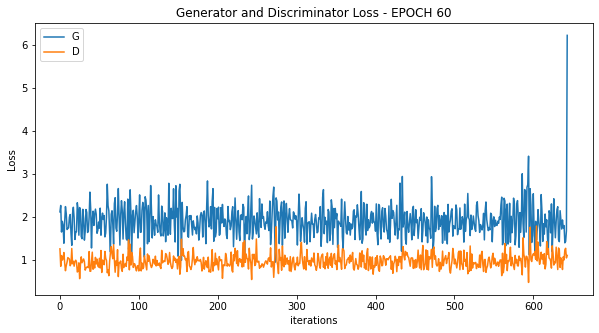

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


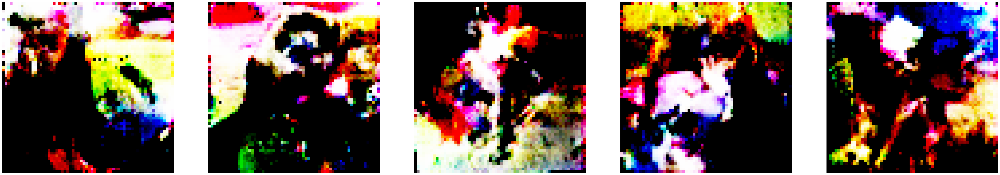

[62/100][322/644] Loss_D: 0.7517 Loss_G: 2.0399 D(x): 0.7755 D(G(z)): 0.2644 / 0.1449
[62/100][644/644] Loss_D: 0.8665 Loss_G: 1.9165 D(x): 0.4673 D(G(z)): 0.0961 / 0.1222



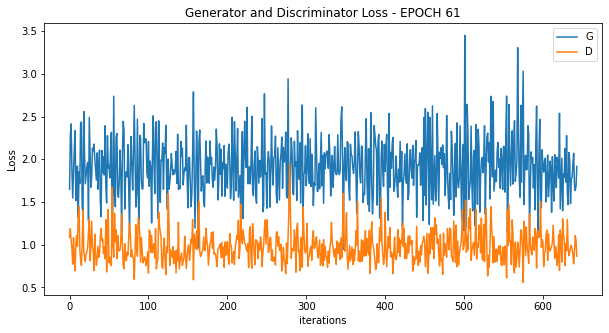

[63/100][322/644] Loss_D: 1.1958 Loss_G: 2.0043 D(x): 0.5970 D(G(z)): 0.3799 / 0.1291
[63/100][644/644] Loss_D: 0.5336 Loss_G: 3.0200 D(x): 0.6638 D(G(z)): 0.0388 / 0.0352



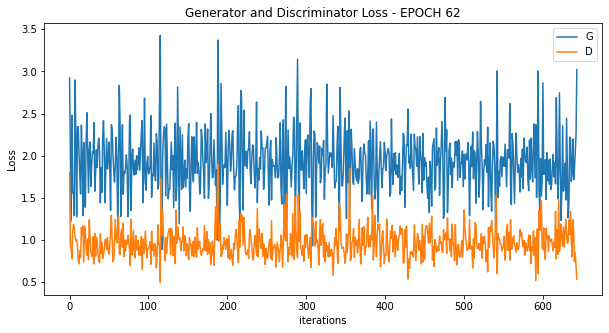

[64/100][322/644] Loss_D: 1.3690 Loss_G: 1.0855 D(x): 0.4194 D(G(z)): 0.2988 / 0.3400
[64/100][644/644] Loss_D: 2.0176 Loss_G: 5.8058 D(x): 0.3300 D(G(z)): 0.4567 / 0.0188



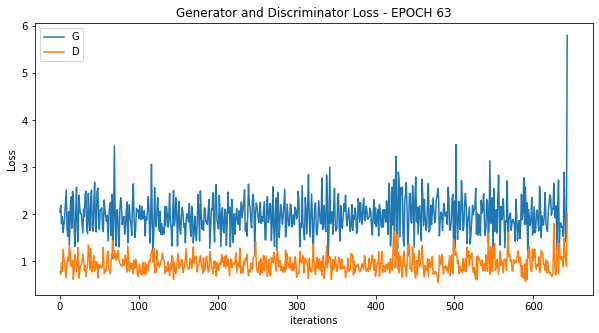

[65/100][322/644] Loss_D: 1.0729 Loss_G: 1.5628 D(x): 0.5234 D(G(z)): 0.2264 / 0.2571
[65/100][644/644] Loss_D: 1.5715 Loss_G: 0.7590 D(x): 0.2264 D(G(z)): 0.0932 / 0.4822



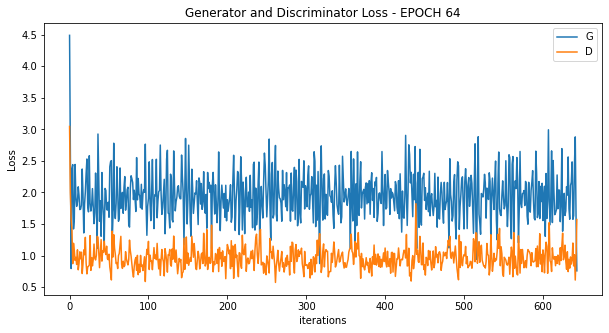

[66/100][322/644] Loss_D: 0.8211 Loss_G: 1.9136 D(x): 0.7341 D(G(z)): 0.2682 / 0.1556
[66/100][644/644] Loss_D: 0.6746 Loss_G: 4.0804 D(x): 0.6776 D(G(z)): 0.1267 / 0.0110



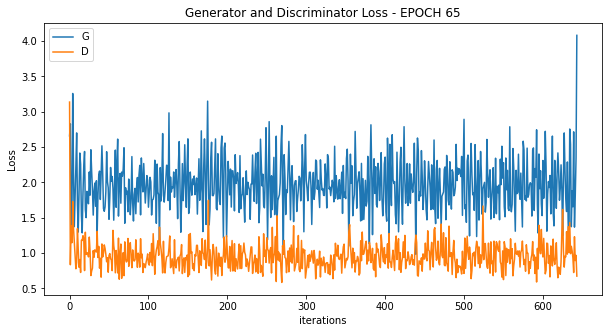

[67/100][322/644] Loss_D: 0.8805 Loss_G: 2.0401 D(x): 0.5390 D(G(z)): 0.1268 / 0.1255
[67/100][644/644] Loss_D: 1.2501 Loss_G: 2.2407 D(x): 0.3066 D(G(z)): 0.1373 / 0.1256



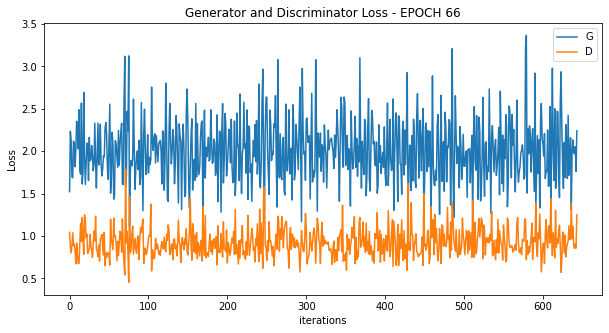

[68/100][322/644] Loss_D: 0.9885 Loss_G: 2.0364 D(x): 0.4821 D(G(z)): 0.0930 / 0.1349
[68/100][644/644] Loss_D: 0.7868 Loss_G: 3.9915 D(x): 0.6002 D(G(z)): 0.1741 / 0.0164



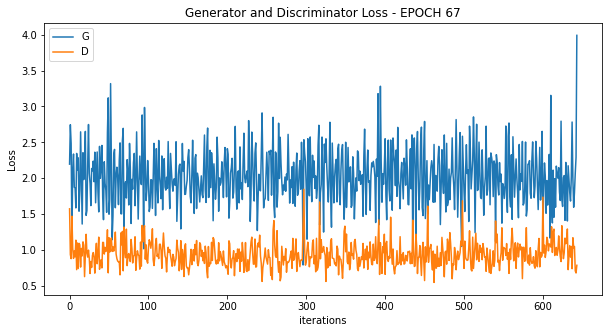

[69/100][322/644] Loss_D: 1.0405 Loss_G: 2.5767 D(x): 0.7755 D(G(z)): 0.4100 / 0.0768
[69/100][644/644] Loss_D: 0.7472 Loss_G: 3.0582 D(x): 0.5478 D(G(z)): 0.1019 / 0.0498



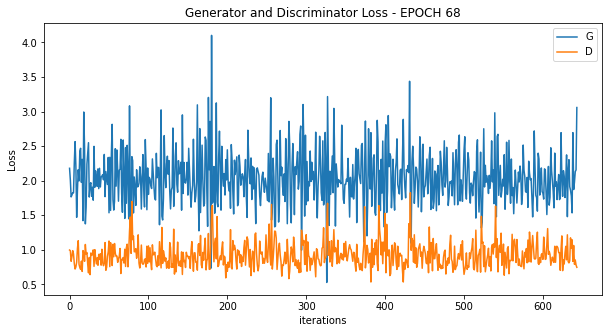

[70/100][322/644] Loss_D: 1.3763 Loss_G: 2.9555 D(x): 0.7324 D(G(z)): 0.5405 / 0.0609
[70/100][644/644] Loss_D: 0.7194 Loss_G: 2.5224 D(x): 0.5825 D(G(z)): 0.0719 / 0.0726



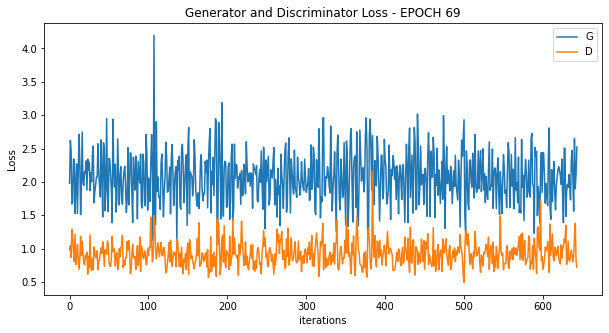

[71/100][322/644] Loss_D: 0.5667 Loss_G: 2.8767 D(x): 0.7397 D(G(z)): 0.1056 / 0.0655
[71/100][644/644] Loss_D: 1.3117 Loss_G: 2.2961 D(x): 0.3175 D(G(z)): 0.0730 / 0.0789



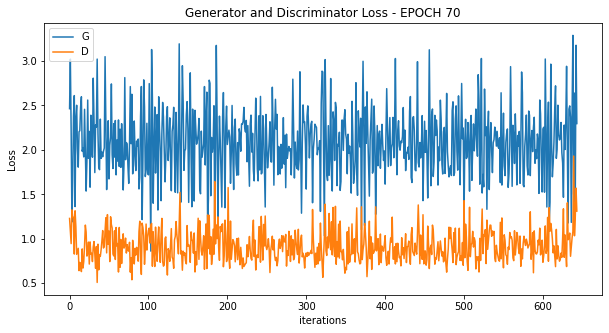

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


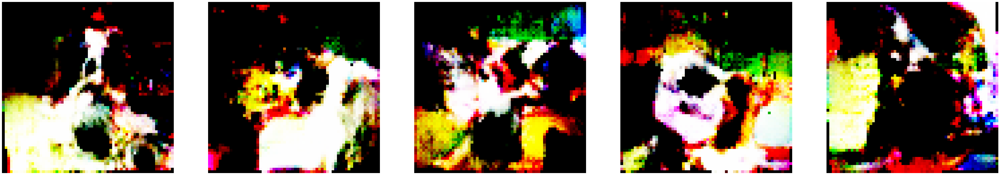

[72/100][322/644] Loss_D: 0.7211 Loss_G: 2.1052 D(x): 0.8343 D(G(z)): 0.2488 / 0.1309
[72/100][644/644] Loss_D: 1.1945 Loss_G: 2.4585 D(x): 0.3851 D(G(z)): 0.1158 / 0.0997



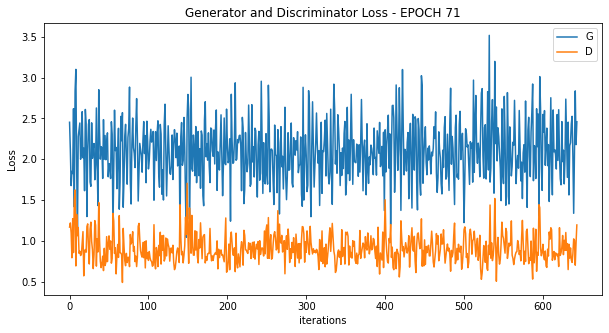

[73/100][322/644] Loss_D: 0.7195 Loss_G: 2.5448 D(x): 0.8112 D(G(z)): 0.2246 / 0.0915
[73/100][644/644] Loss_D: 0.8930 Loss_G: 2.6032 D(x): 0.4620 D(G(z)): 0.0453 / 0.0610



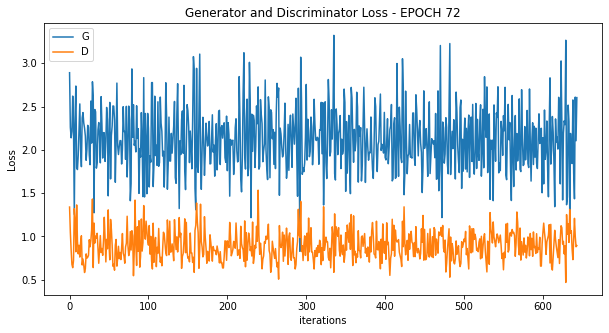

[74/100][322/644] Loss_D: 1.0125 Loss_G: 1.9466 D(x): 0.4830 D(G(z)): 0.1000 / 0.1468
[74/100][644/644] Loss_D: 2.1584 Loss_G: 1.4119 D(x): 0.1626 D(G(z)): 0.0627 / 0.2403



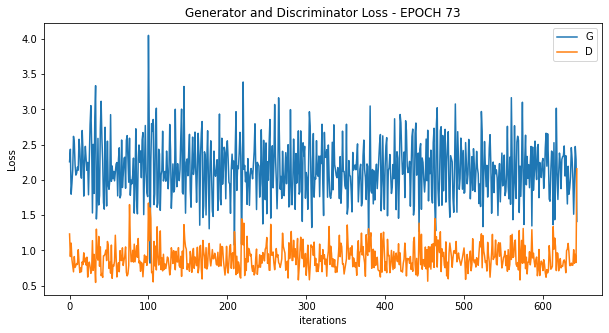

[75/100][322/644] Loss_D: 0.7920 Loss_G: 2.4097 D(x): 0.7413 D(G(z)): 0.2513 / 0.0965
[75/100][644/644] Loss_D: 1.4570 Loss_G: 3.4419 D(x): 0.2768 D(G(z)): 0.2065 / 0.0454



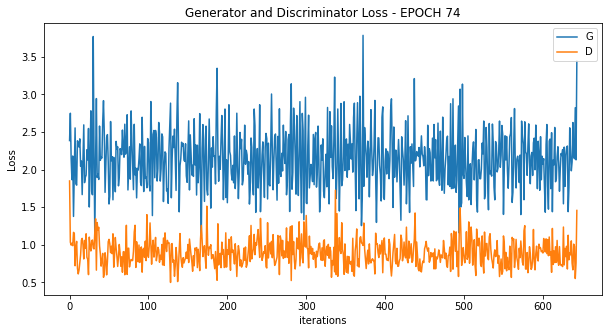

[76/100][322/644] Loss_D: 0.8798 Loss_G: 2.2210 D(x): 0.7146 D(G(z)): 0.2946 / 0.1095
[76/100][644/644] Loss_D: 1.5460 Loss_G: 1.5515 D(x): 0.2650 D(G(z)): 0.0415 / 0.1978



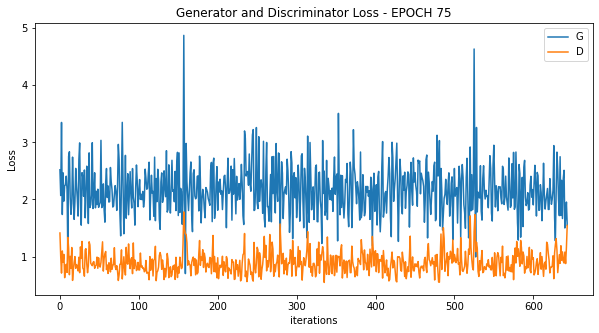

[77/100][322/644] Loss_D: 0.7403 Loss_G: 2.4640 D(x): 0.7573 D(G(z)): 0.2553 / 0.0868
[77/100][644/644] Loss_D: 0.5672 Loss_G: 3.4853 D(x): 0.6179 D(G(z)): 0.0321 / 0.0281



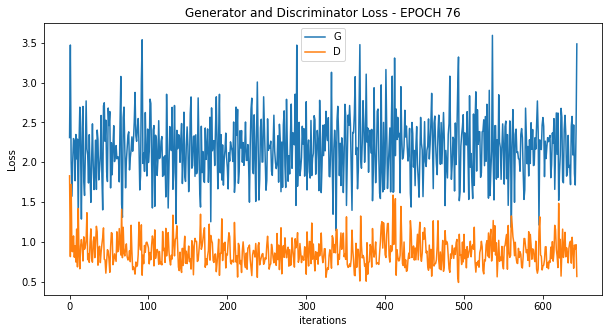

[78/100][322/644] Loss_D: 0.9529 Loss_G: 2.5668 D(x): 0.8937 D(G(z)): 0.3959 / 0.0793
[78/100][644/644] Loss_D: 2.5081 Loss_G: 2.2680 D(x): 0.1411 D(G(z)): 0.1559 / 0.1017



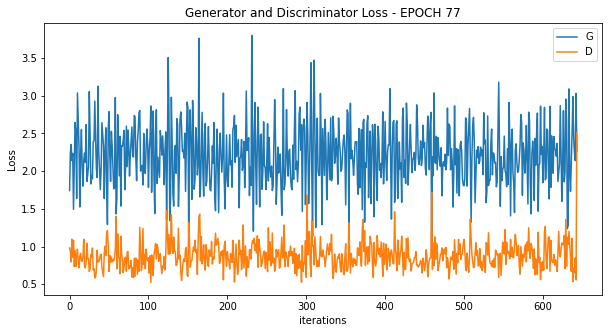

[79/100][322/644] Loss_D: 0.6733 Loss_G: 2.3447 D(x): 0.7156 D(G(z)): 0.1538 / 0.1066
[79/100][644/644] Loss_D: 0.8902 Loss_G: 6.8881 D(x): 0.6548 D(G(z)): 0.2672 / 0.0039



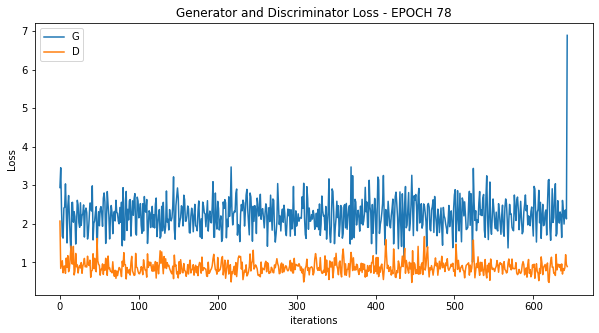

[80/100][322/644] Loss_D: 0.6427 Loss_G: 2.8445 D(x): 0.7032 D(G(z)): 0.0939 / 0.0626
[80/100][644/644] Loss_D: 1.5816 Loss_G: 0.8498 D(x): 0.2274 D(G(z)): 0.0408 / 0.4195



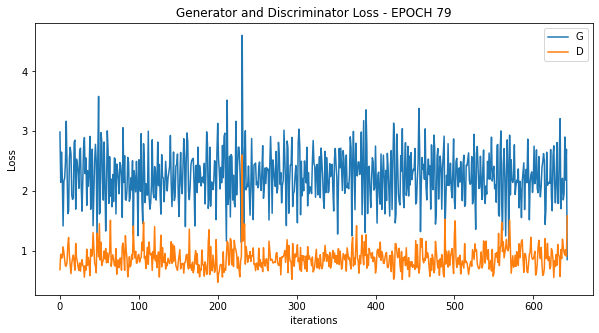

[81/100][322/644] Loss_D: 0.9101 Loss_G: 2.3409 D(x): 0.7898 D(G(z)): 0.3177 / 0.1016
[81/100][644/644] Loss_D: 1.8859 Loss_G: 5.6679 D(x): 0.2513 D(G(z)): 0.3123 / 0.0201



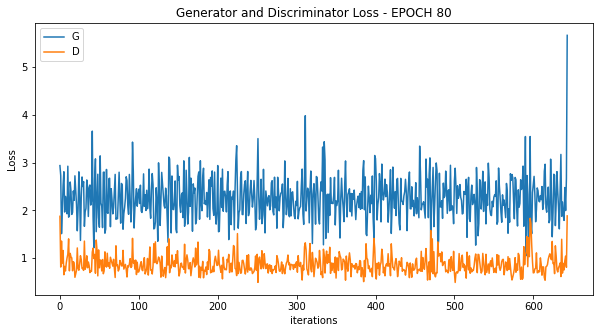

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


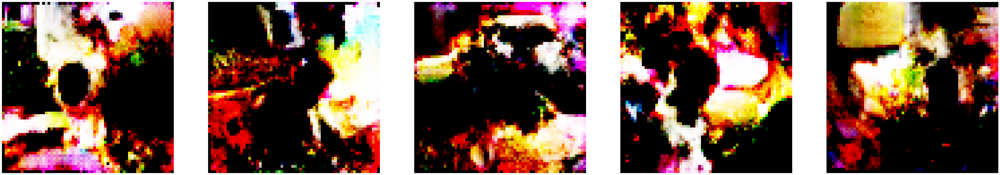

[82/100][322/644] Loss_D: 1.0191 Loss_G: 1.5431 D(x): 0.5531 D(G(z)): 0.2279 / 0.2373
[82/100][644/644] Loss_D: 2.3487 Loss_G: 2.0815 D(x): 0.1406 D(G(z)): 0.1606 / 0.1101



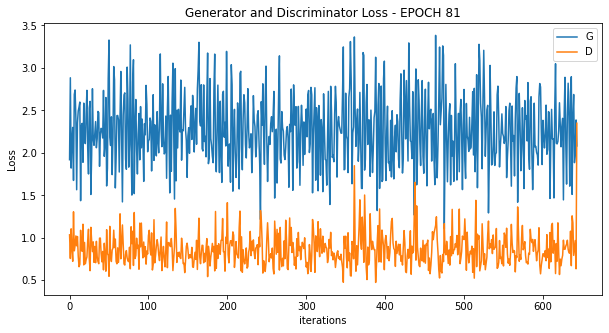

[83/100][322/644] Loss_D: 0.6648 Loss_G: 2.0522 D(x): 0.7736 D(G(z)): 0.1809 / 0.1272
[83/100][644/644] Loss_D: 0.8177 Loss_G: 5.5432 D(x): 0.7245 D(G(z)): 0.2405 / 0.0089



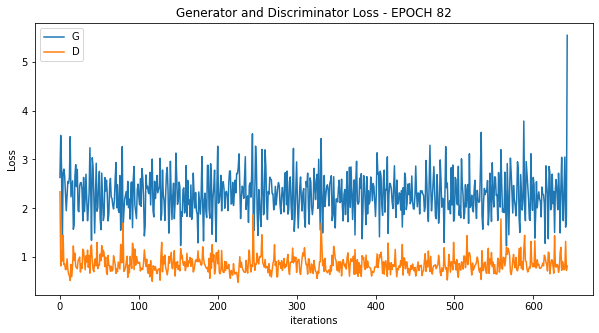

[84/100][322/644] Loss_D: 0.6424 Loss_G: 2.7984 D(x): 0.7256 D(G(z)): 0.1374 / 0.0615
[84/100][644/644] Loss_D: 0.5443 Loss_G: 3.6154 D(x): 0.6497 D(G(z)): 0.0352 / 0.0198



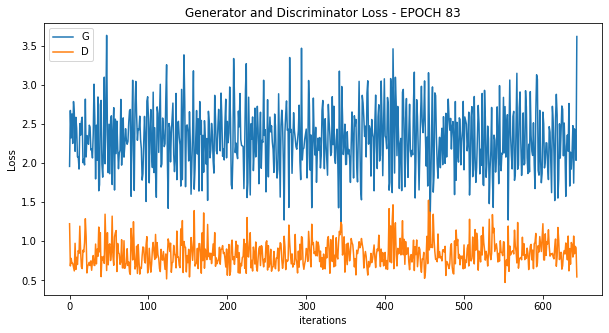

[85/100][322/644] Loss_D: 0.8254 Loss_G: 1.8255 D(x): 0.6477 D(G(z)): 0.1983 / 0.1701
[85/100][644/644] Loss_D: 0.3811 Loss_G: 5.1702 D(x): 0.8415 D(G(z)): 0.0165 / 0.0051



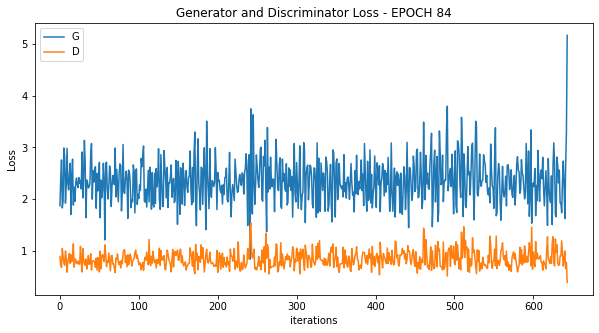

[86/100][322/644] Loss_D: 0.6924 Loss_G: 2.0978 D(x): 0.6923 D(G(z)): 0.1375 / 0.1367
[86/100][644/644] Loss_D: 0.8661 Loss_G: 6.5701 D(x): 0.5794 D(G(z)): 0.2415 / 0.0016



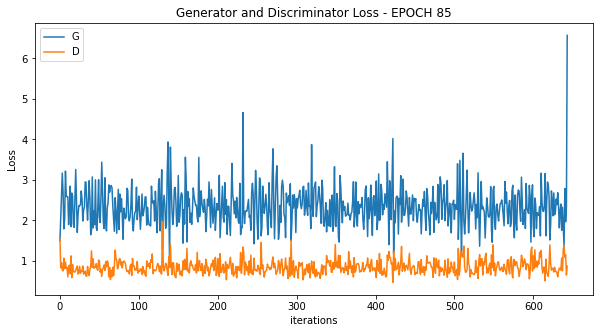

[87/100][322/644] Loss_D: 1.3621 Loss_G: 1.9747 D(x): 0.4718 D(G(z)): 0.3347 / 0.1427
[87/100][644/644] Loss_D: 4.0207 Loss_G: 1.0856 D(x): 0.0194 D(G(z)): 0.0597 / 0.3638



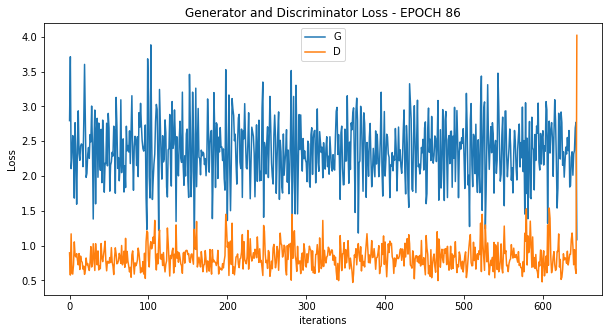

[88/100][322/644] Loss_D: 0.8130 Loss_G: 2.0716 D(x): 0.6080 D(G(z)): 0.1389 / 0.1369
[88/100][644/644] Loss_D: 0.8678 Loss_G: 5.9923 D(x): 0.6308 D(G(z)): 0.2498 / 0.0013



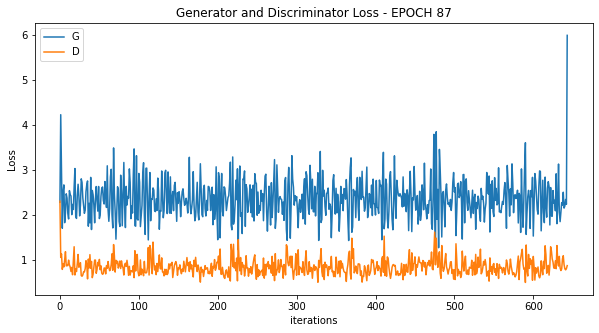

[89/100][322/644] Loss_D: 0.7660 Loss_G: 2.2632 D(x): 0.6415 D(G(z)): 0.1593 / 0.1123
[89/100][644/644] Loss_D: 1.0963 Loss_G: 9.1646 D(x): 0.7168 D(G(z)): 0.3288 / 0.0007



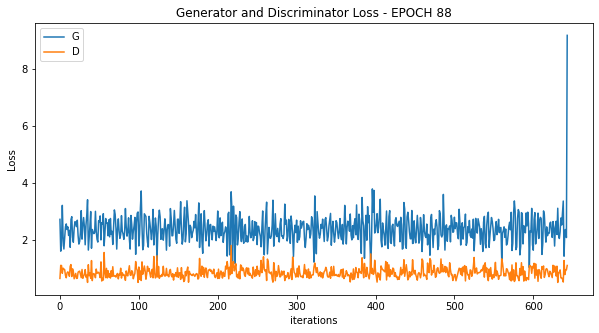

[90/100][322/644] Loss_D: 0.8445 Loss_G: 2.5065 D(x): 0.8441 D(G(z)): 0.3202 / 0.0837
[90/100][644/644] Loss_D: 0.4452 Loss_G: 4.9796 D(x): 0.9354 D(G(z)): 0.0997 / 0.0042



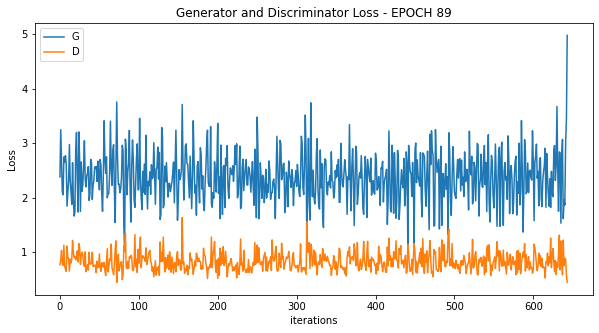

[91/100][322/644] Loss_D: 0.8354 Loss_G: 2.6916 D(x): 0.8306 D(G(z)): 0.3226 / 0.0667
[91/100][644/644] Loss_D: 1.2268 Loss_G: 5.6034 D(x): 0.4524 D(G(z)): 0.2632 / 0.0063



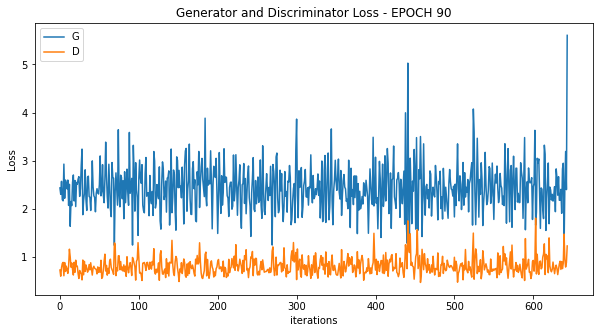

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


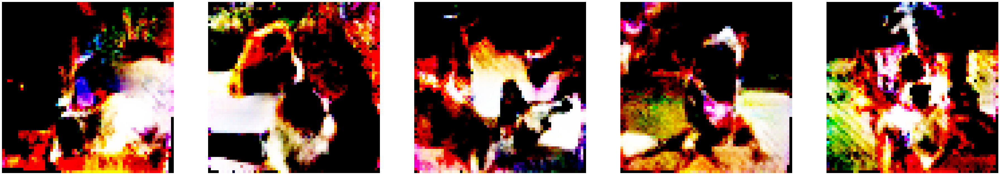

[92/100][322/644] Loss_D: 1.1658 Loss_G: 2.7939 D(x): 0.7595 D(G(z)): 0.4567 / 0.0535
[92/100][644/644] Loss_D: 1.1283 Loss_G: 2.7510 D(x): 0.3374 D(G(z)): 0.0241 / 0.0638



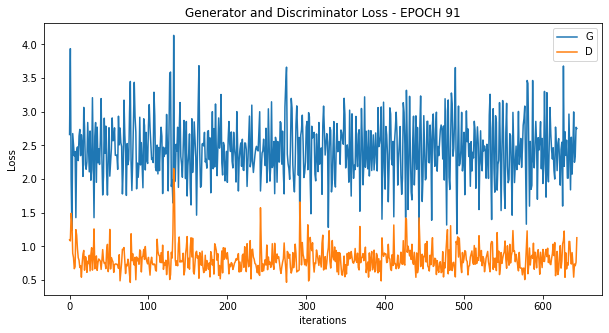

[93/100][322/644] Loss_D: 0.6116 Loss_G: 2.6488 D(x): 0.8176 D(G(z)): 0.1706 / 0.0770
[93/100][644/644] Loss_D: 0.5722 Loss_G: 3.9313 D(x): 0.6642 D(G(z)): 0.0648 / 0.0128



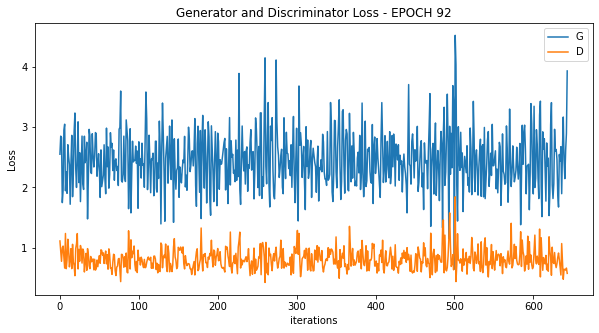

[94/100][322/644] Loss_D: 0.8622 Loss_G: 2.7313 D(x): 0.8118 D(G(z)): 0.3027 / 0.0961
[94/100][644/644] Loss_D: 3.0060 Loss_G: 0.8840 D(x): 0.0391 D(G(z)): 0.0278 / 0.4517



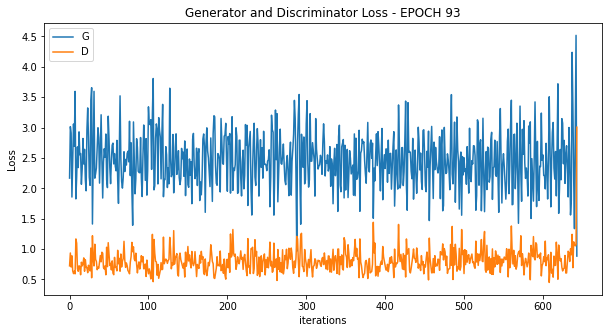

[95/100][322/644] Loss_D: 0.9178 Loss_G: 2.2597 D(x): 0.4905 D(G(z)): 0.0674 / 0.1216
[95/100][644/644] Loss_D: 0.5899 Loss_G: 4.3846 D(x): 0.9656 D(G(z)): 0.0949 / 0.0077



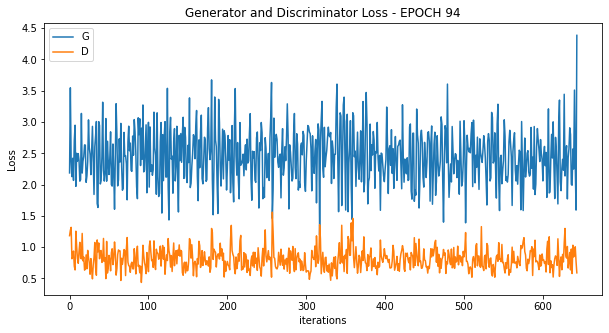

[96/100][322/644] Loss_D: 0.7648 Loss_G: 2.3942 D(x): 0.8107 D(G(z)): 0.2775 / 0.1061
[96/100][644/644] Loss_D: 0.5763 Loss_G: 3.8076 D(x): 0.6601 D(G(z)): 0.0792 / 0.0193



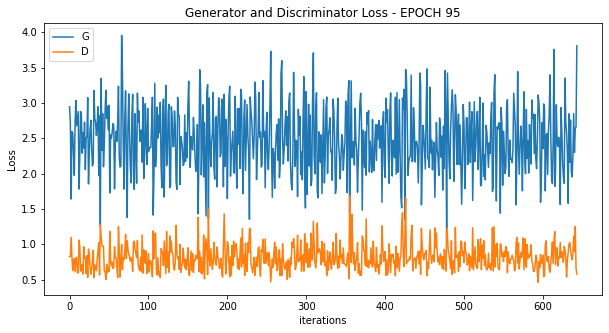

[97/100][322/644] Loss_D: 0.6976 Loss_G: 2.1388 D(x): 0.5928 D(G(z)): 0.0714 / 0.1368
[97/100][644/644] Loss_D: 2.5203 Loss_G: 2.2661 D(x): 0.0625 D(G(z)): 0.0081 / 0.0981



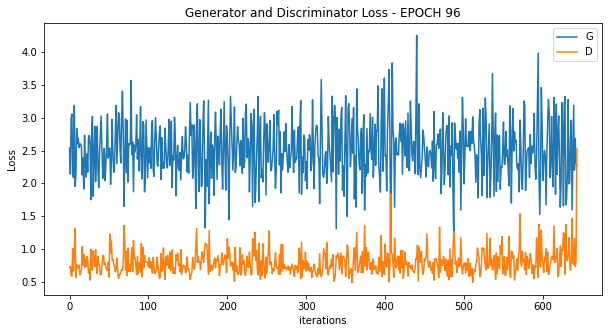

[98/100][322/644] Loss_D: 1.0776 Loss_G: 1.8528 D(x): 0.5779 D(G(z)): 0.2547 / 0.1720
[98/100][644/644] Loss_D: 0.4817 Loss_G: 3.6980 D(x): 0.7546 D(G(z)): 0.0681 / 0.0182



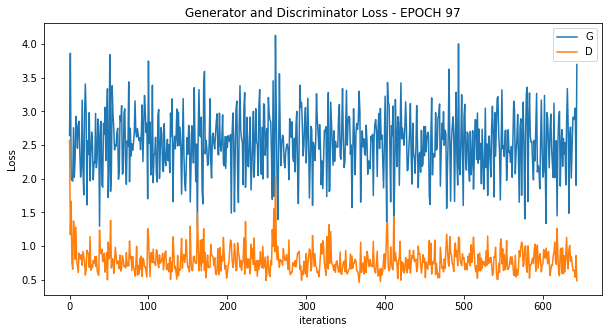

[99/100][322/644] Loss_D: 0.6234 Loss_G: 2.6851 D(x): 0.8358 D(G(z)): 0.1682 / 0.0800
[99/100][644/644] Loss_D: 1.1685 Loss_G: 8.5658 D(x): 0.5186 D(G(z)): 0.3435 / 0.0018



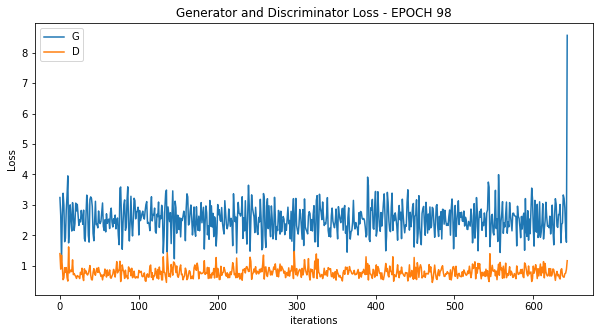

[100/100][322/644] Loss_D: 0.6203 Loss_G: 2.9432 D(x): 0.8371 D(G(z)): 0.1763 / 0.0601
[100/100][644/644] Loss_D: 0.6147 Loss_G: 5.8852 D(x): 0.7111 D(G(z)): 0.1387 / 0.0041



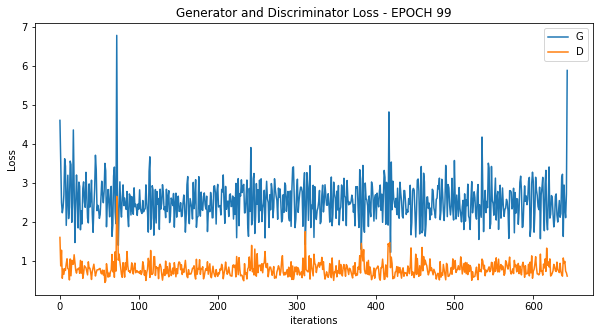

In [ ]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [ ]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  133.33349474668503


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


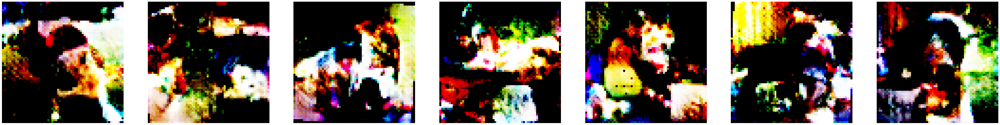

In [ ]:
show_generated_img(7)

## Checking the results

In [ ]:
if not os.path.exists('/content/output_images'):
    os.mkdir('/content/output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('/content/output_images', f'image_{i_batch+i_image:05d}.png'))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

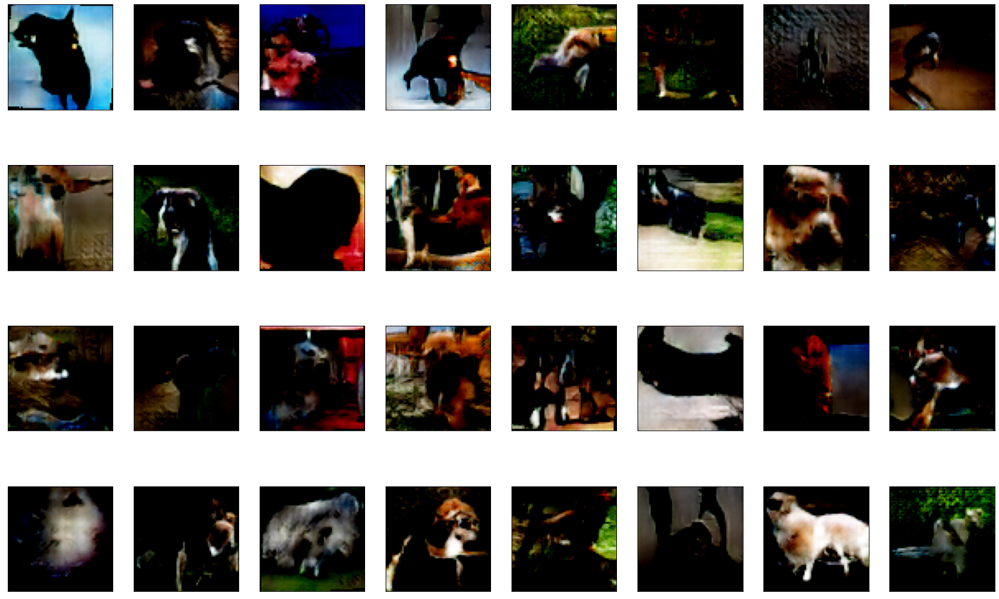

In [ ]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

# Loading a trained model from Hoffman2

To see how good will be the result that our current model can get, I used GPU V100 on Hoffman2 running 600 epchs and saved the model to my google drive. 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
filenameG_pth = '/content/drive/My Drive/saved_model/GANdogs_600epochs_2020Sept12/ckpt_gandogs_g.pth'
filenameD_pth = '/content/drive/My Drive/saved_model/GANdogs_600epochs_2020Sept12/ckpt_gandogs_d.pth'

netG = Generator(nz).to(device)
netD = Discriminator().to(device)
netG.load_state_dict(torch.load(filenameG_pth))
netD.load_state_dict(torch.load(filenameD_pth))

<All keys matched successfully>

In [ ]:
if not os.path.exists('/content/output_images'):
    os.mkdir('/content/output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = (gen_images.to("cpu").clone().detach()+1)/2
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('/content/output_images', f'image_{i_batch+i_image:05d}.png'))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


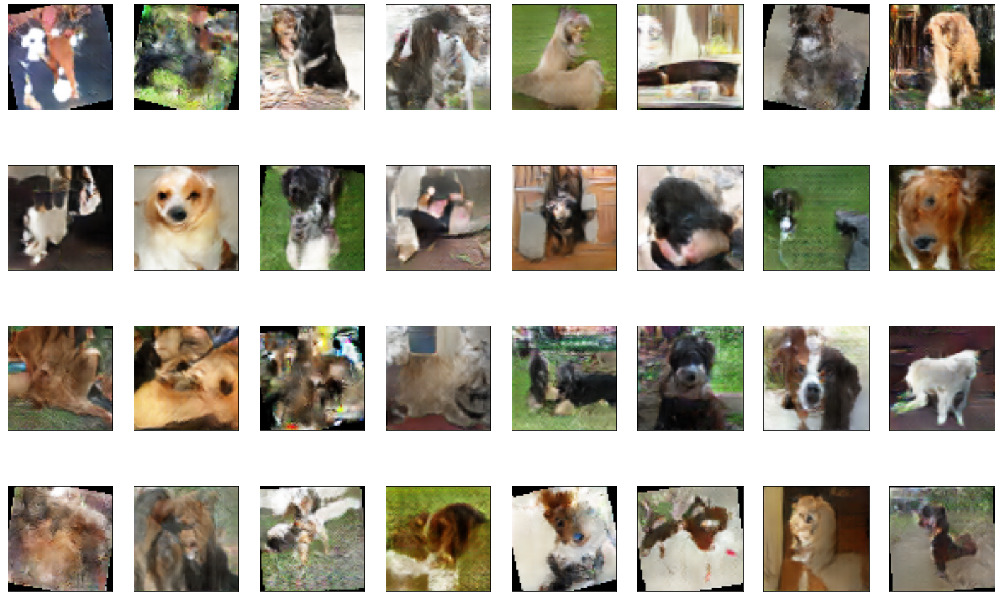

In [ ]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

In [ ]:
gen_z = torch.randn(32, nz, 1, 1, device=device)
gen_images = (netG(gen_z).to("cpu").clone().detach() + 1)/2
gen_images = gen_images.numpy().transpose(0, 2, 3, 1)

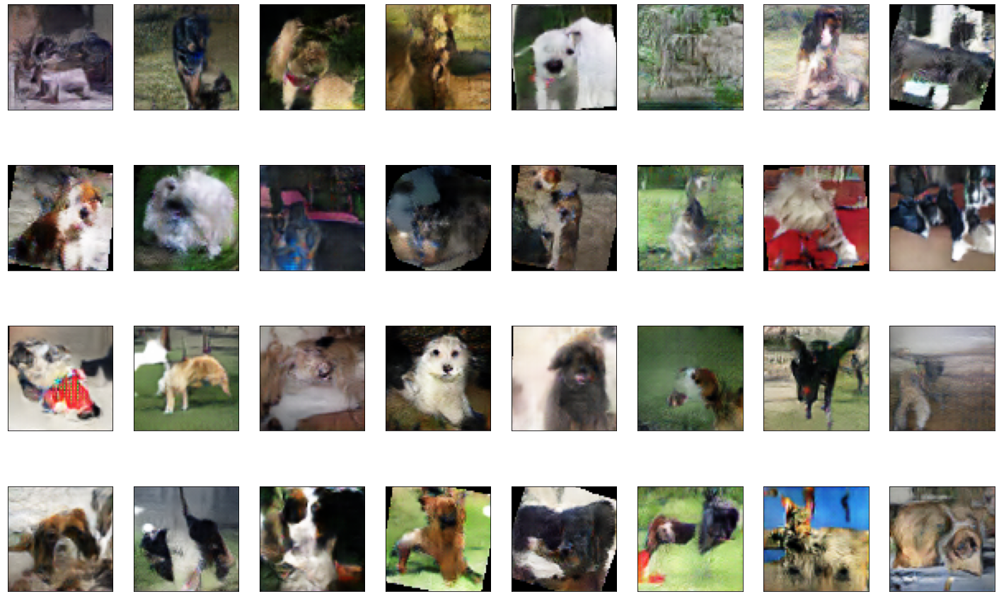

In [ ]:
fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(gen_images):
    ax = fig.add_subplot(4, 8, ii + 1, xticks=[], yticks=[])
    plt.imshow(img)

## MiFID metric

Check the kaggle competition [page](https://www.kaggle.com/c/generative-dog-images/overview/evaluation) for the evaluation information.

Warning: The Tensorflow-v1.x based demo code in the kernal is not working.